# MNIST Digit Synthesis using GANs (PyTorch)

## Project Overview

This project focuses on generating handwritten digit images using a Generative Adversarial Network (GAN) trained on the MNIST dataset. The GAN is implemented using PyTorch and is trained to produce realistic images of digits ranging from 0 to 9.

---

## Objectives

- Understand the fundamentals of GAN architecture
- Implement a simple GAN from scratch using PyTorch
- Train the GAN on the MNIST dataset
- Generate and visualize synthetic digit images

---

## Tools and Libraries

- Python
- PyTorch
- torchvision
- matplotlib
- numpy

---

## Architecture

- **Generator**: Takes random noise as input and learns to generate realistic digit images
- **Discriminator**: Learns to differentiate between real and generated (fake) digit images
- Both networks are trained simultaneously in an adversarial setup

---

## Evaluation

- Periodic visualization of generated digits
- Tracking generator and discriminator losses over time
- Optional: exploration of the latent space

---

## Outcome

After training, the generator should be able to produce synthetic digit images that closely resemble real MNIST digits, showcasing the effectiveness of adversarial training for image generation tasks.

---

*This project serves as a hands-on introduction to GANs and lays the groundwork for more advanced generative models.*


## Importing Libraries and Setting Seed

In this section, we import the essential libraries required for building and training the GAN model using PyTorch.

- `torch`, `torch.nn`: For building neural network components and handling tensors
- `tqdm.auto`: For displaying progress bars during training
- `torchvision.transforms`: For applying transformations to the dataset
- `torchvision.datasets.MNIST`: To load the MNIST training dataset
- `torchvision.utils.make_grid`: For visualizing image grids
- `torch.utils.data.DataLoader`: To efficiently load data in batches
- `matplotlib.pyplot`: For visualizing data and generated images

We also set a manual seed using `torch.manual_seed(0)` to ensure reproducibility during testing and development.


In [1]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.datasets import MNIST # Training dataset
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
torch.manual_seed(0) # Set for testing purposes, please do not change!



In [16]:
def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28)):
    '''
    Function for visualizing images: Given a tensor of images, number of images, and
    size per image, plots and prints the images in a uniform grid.
    '''
    image_unflat = image_tensor.detach().cpu().view(-1, *size)
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()

In [8]:
print("CUDA Available:", torch.cuda.is_available())


CUDA Available: True


In [9]:
if torch.cuda.is_available():
    print("CUDA Device Count:", torch.cuda.device_count())
    print("Current CUDA Device:", torch.cuda.current_device())
    print("CUDA Device Name:", torch.cuda.get_device_name(torch.cuda.current_device()))


CUDA Device Count: 1
Current CUDA Device: 0
CUDA Device Name: NVIDIA A10G


## Defining the Generator Block

### What is a Generator?

In a Generative Adversarial Network (GAN), the **generator** is a neural network that learns to map random noise vectors (latent space) to data resembling the real dataset—in this case, handwritten digit images from the MNIST dataset. The goal of the generator is to produce images that are convincing enough to fool the discriminator into believing they are real.

### Generator Block Function

The `get_generator_block` function defines a single block used within the generator network. Each block consists of the following layers:

- **Linear Layer (`nn.Linear`)**: Applies a linear transformation to the input data.
- **Batch Normalization (`nn.BatchNorm1d`)**: Normalizes the output of the linear layer to stabilize and accelerate training.
- **ReLU Activation (`nn.ReLU`)**: Introduces non-linearity to help the network learn complex patterns.

The function takes two arguments:
- `input_dim`: Number of input features
- `output_dim`: Number of output features

It returns an `nn.Sequential` object that chains the above layers together to form a modular generator block.


In [2]:
def get_generator_block(input_dim, output_dim):
    """
    Returns a generator block consisting of a Linear layer, 
    Batch Normalization, and ReLU activation.
    
    Args:
        input_dim (int): Size of the input features.
        output_dim (int): Size of the output features.
        
    Returns:
        nn.Sequential: Generator block.
    """
    return nn.Sequential(
        nn.Linear(input_dim, output_dim),
        nn.BatchNorm1d(output_dim),
        nn.ReLU(inplace=True)
    )


## Generator Network

### What is the Generator Network?

The **generator** in a GAN is responsible for generating synthetic data (in this case, MNIST digits) from random noise. The network learns to generate data that is similar to the real dataset, making it difficult for the discriminator to differentiate between real and fake samples.

### Generator Class

The `Generator` class defines the architecture of the generator network for the MNIST digit synthesis using a Vanilla GAN. The network takes a random noise vector and transforms it into a generated image. Here's how it's structured:

#### Arguments:
- **z_dim (int)**: Dimension of the input noise vector. By default, this is set to `10`, meaning the generator takes a noise vector of size `10` as input.
- **im_dim (int)**: Dimension of the flattened output image. Default is `784`, which corresponds to a `28x28` pixel image, as the MNIST images are 28x28 in size.
- **hidden_dim (int)**: Base size of the hidden layers. Default is `128`.

#### Layers in the Generator:
1. **`get_generator_block`**: The network is built using several blocks of `Linear`, `BatchNorm1d`, and `ReLU` layers (defined in the `get_generator_block` function). 
   - The first block takes the noise vector of size `z_dim` and maps it to a hidden representation of size `hidden_dim`.
   - Each subsequent block increases the complexity of the features by expanding the dimensions of the hidden layers (by a factor of 2).
2. **`nn.Linear`**: The final layer reduces the size of the output to match the flattened image dimensions (`im_dim` or `784` for MNIST).
3. **`nn.Sigmoid`**: A sigmoid activation function is applied to the output to ensure that pixel values are between 0 and 1, as required for image representation.

#### Forward Pass:
The `forward` method defines how the noise vector is passed through the generator network. The input `noise` (a tensor) is passed through the sequential layers, and the output is a flattened image of size `im_dim` (784).

---
*The generator's goal is to transform the random noise into meaningful data that appears as real MNIST digits, which is then fed into the discriminator for evaluation.*


In [4]:
class Generator(nn.Module):
    """
    Generator Network for MNIST Digit Synthesis using a Vanilla GAN.

    Args:
        z_dim (int): Dimension of the input noise vector.
        im_dim (int): Dimension of the flattened output image (default: 784 for 28x28).
        hidden_dim (int): Base hidden layer size.
    """
    def __init__(self, z_dim=10, im_dim=784, hidden_dim=128):
        super(Generator, self).__init__()
        self.gen = nn.Sequential(
            get_generator_block(z_dim, hidden_dim),
            get_generator_block(hidden_dim, hidden_dim * 2),
            get_generator_block(hidden_dim * 2, hidden_dim * 4),
            get_generator_block(hidden_dim * 4, hidden_dim * 8),
            nn.Linear(hidden_dim * 8, im_dim),
            nn.Sigmoid()
        )

    def forward(self, noise):
        """
        Performs a forward pass through the generator.

        Args:
            noise (Tensor): Noise vector of shape (batch_size, z_dim)
        Returns:
            Tensor: Flattened generated image of shape (batch_size, im_dim)
        """
        return self.gen(noise)


## Generating Noise Vectors

### What is a Noise Vector?

The **noise vector** (often denoted as `z`) is a crucial part of a GAN's generator. It serves as the input for the generator to produce synthetic data (in this case, images). Each noise vector is randomly generated and acts as a seed, ensuring that even when the generator creates multiple images for the same class, each image will be unique.

The noise vector is typically sampled from a **normal distribution** and is used as input for the generator network. By passing different noise vectors through the generator, the network can produce diverse outputs.

### Generating Noise in PyTorch

In order to generate the noise vector, you can use PyTorch's `torch.randn` function, which samples random numbers from a normal distribution (mean = 0, standard deviation = 1). Since the generator will process multiple noise vectors at once, we generate all noise vectors in a batch.

#### Key Points:
- Ensure that noise vectors are created on the target device (CPU or GPU). For example:
  ```python
  noise = torch.randn(batch_size, z_dim, device=device)


In [5]:
def get_noise(n_samples, z_dim, device='cpu'):
    """
    Generate noise vectors sampled from a normal distribution.
    
    Args:
        n_samples (int): Number of noise samples to generate.
        z_dim (int): Dimension of each noise vector.
        device (str): Device to place the tensor on ('cpu' or 'cuda').

    Returns:
        Tensor: Noise tensor of shape (n_samples, z_dim).
    """
    return torch.randn(n_samples, z_dim, device=device)


## Defining the Discriminator Block

### What is the Discriminator?

In a Generative Adversarial Network (GAN), the **discriminator** is a neural network that learns to distinguish between real and generated (fake) data. It evaluates whether an input image is a real sample from the dataset or a synthetic image generated by the generator. The goal of the discriminator is to correctly classify real and fake images, while the generator aims to fool it into thinking that the fake images are real.

### Discriminator Block Function

The `get_discriminator_block` function defines a single block used within the discriminator network. Each block consists of the following layers:

- **Linear Layer (`nn.Linear`)**: Applies a linear transformation to the input data.
- **LeakyReLU Activation (`nn.LeakyReLU`)**: Introduces non-linearity, with a small negative slope (0.2) for negative values. This prevents dead neurons and helps the network learn more effectively.

The function takes two arguments:
- **input_dim**: Number of input features (flattened image size).
- **output_dim**: Number of output features (number of neurons in the current layer).

It returns an `nn.Sequential` object that chains the above layers together to form a modular discriminator block.

#### Example Block:

```python
def get_discriminator_block(input_dim, output_dim):
    """
    Create a discriminator block with a linear layer followed by a LeakyReLU activation.

    Args:
        input_dim (int): Dimension of the input features.
        output_dim (int): Dimension of the output features.

    Returns:
        nn.Sequential: Discriminator block.
    """
    return nn.Sequential(
        nn.Linear(input_dim, output_dim),
        nn.LeakyReLU(0.2)
    )


In [6]:
def get_discriminator_block(input_dim, output_dim):
    """
    Create a discriminator block with a linear layer followed by a LeakyReLU activation.
    
    Args:
        input_dim (int): Dimension of the input features.
        output_dim (int): Dimension of the output features.

    Returns:
        nn.Sequential: Discriminator block.
    """
    return nn.Sequential(
        nn.Linear(input_dim, output_dim),
        nn.LeakyReLU(0.2)
    )


## Discriminator Network

### What is the Discriminator Network?

In a GAN, the **discriminator** network plays the role of distinguishing between real and fake data. The discriminator is trained to classify images as either real (from the actual dataset) or fake (generated by the generator). It outputs a probability score between 0 and 1, where values closer to 1 indicate "real," and values closer to 0 indicate "fake."

The discriminator and generator are trained in an adversarial manner: while the generator improves at producing realistic images, the discriminator improves at detecting fake ones. This adversarial training process leads to the generator producing increasingly realistic images over time.

### Discriminator Class

The `Discriminator` class defines the architecture of the discriminator network. The network takes a flattened image as input and outputs a scalar value that represents whether the image is real or fake.

#### Arguments:
- **im_dim (int)**: The dimension of the input image. By default, this is `784` for a flattened `28x28` image (as in the MNIST dataset).
- **hidden_dim (int)**: The base size of the hidden layers. Default is `128`.

#### Layers in the Discriminator:
1. **`get_discriminator_block`**: The network is built using several blocks of `Linear` layers followed by `LeakyReLU` activations. 
   - The first block maps the input image to a larger hidden representation (`hidden_dim * 4`).
   - Each subsequent block reduces the dimensionality gradually to produce a smaller representation at the end (`hidden_dim`).
2. **`nn.Linear`**: The final layer reduces the output size to a single value, representing the probability that the image is real (1) or fake (0).
3. **Output Layer**: This layer outputs a value between 0 and 1, using a sigmoid activation function (implicitly assumed, as it's used in training with binary cross-entropy loss).

#### Forward Pass:
The `forward` method defines how the input image is passed through the discriminator network. The image tensor is passed through the sequential layers, and the output is a scalar value indicating whether the image is real or fake.

```python
def forward(self, image):
    """
    Forward pass through the discriminator.

    Args:
        image (Tensor): Flattened image tensor (batch_size, im_dim).

    Returns:
        Tensor: A single value representing real (1) or fake (0).
    """
    return self.disc(image)


In [7]:
class Discriminator(nn.Module):
    """
    Discriminator Network for distinguishing between real and fake images.

    Args:
        im_dim (int): The dimension of the input image (default: 784 for 28x28).
        hidden_dim (int): The base hidden layer size.
    """
    def __init__(self, im_dim=784, hidden_dim=128):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            get_discriminator_block(im_dim, hidden_dim * 4),
            get_discriminator_block(hidden_dim * 4, hidden_dim * 2),
            get_discriminator_block(hidden_dim * 2, hidden_dim),
            nn.Linear(hidden_dim, 1)  # Output layer (real/fake)
        )

    def forward(self, image):
        """
        Forward pass through the discriminator.
        
        Args:
            image (Tensor): Flattened image tensor (batch_size, im_dim).
        
        Returns:
            Tensor: A single value representing real (1) or fake (0).
        """
        return self.disc(image)


## Training the GAN

### Setting Up Parameters

To begin training the GAN, you first need to define several important parameters:

1. **`criterion` (Loss Function)**: 
   - The loss function determines how well the generator and discriminator are performing. For binary classification tasks like GANs, we typically use **Binary Cross-Entropy Loss** to measure how well the discriminator can classify real and fake images.
   
2. **`n_epochs` (Number of Epochs)**: 
   - This defines how many times the entire dataset will be passed through the model during training. The higher the number of epochs, the more the model has a chance to learn.
   
3. **`z_dim` (Noise Vector Dimension)**: 
   - This represents the size of the noise vector that is fed into the generator. A larger `z_dim` may allow the generator to produce more complex outputs, while a smaller value can create less variation in the generated data.
   
4. **`display_step`**: 
   - This controls how often you visualize the generated images during training. This step is important to observe how well the generator is improving.
   
5. **`batch_size`**: 
   - This defines how many images are processed together in each forward and backward pass. A larger batch size can speed up training but also requires more memory.
   
6. **`lr` (Learning Rate)**: 
   - The learning rate determines the size of the steps the model takes while updating weights during training. A smaller learning rate ensures more stable training but can make the process slower.
   
7. **`device`**: 
   - The device specifies whether the model runs on the CPU or GPU. Using GPU (CUDA) typically speeds up training when working with deep learning models.



In [8]:
# Set your parameters
criterion = nn.BCEWithLogitsLoss()
n_epochs = 100
z_dim = 64
display_step = 500
batch_size = 128
lr = 0.00001

# Load MNIST dataset as tensors
dataloader = DataLoader(
    MNIST('.', download=False, transform=transforms.ToTensor()),
    batch_size=batch_size,
    shuffle=True)

### DO NOT EDIT ###
device = 'cuda'

## Discriminator Loss Function

The **discriminator loss** is a crucial part of the GAN training process, as it determines how well the discriminator is able to distinguish between real and fake images. The objective of the discriminator is to correctly classify real images as "real" (label = 1) and fake images as "fake" (label = 0). The loss function is used to measure the error in these classifications.

### `get_disc_loss` Function

This function computes the discriminator loss by comparing the discriminator's predictions for both real and fake images against the ground truth.

#### Arguments:
- **`gen` (nn.Module)**: The generator model used to generate fake images.
- **`disc` (nn.Module)**: The discriminator model used to classify images as real or fake.
- **`criterion` (nn.Module)**: The loss function, typically **Binary Cross-Entropy Loss**, used to measure the error between predicted and actual labels.
- **`real` (Tensor)**: A batch of real images (real MNIST images in this case).
- **`num_images` (int)**: The number of images to generate in the batch.
- **`z_dim` (int)**: The dimensionality of the noise vector used by the generator.
- **`device` (str)**: The device type (`'cpu'` or `'cuda'`), determining where the computation will take place.

#### Function Workflow:
1. **Generate Fake Images**:
   - First, random noise vectors are generated using the `get_noise` function.
   - The generator model (`gen`) is used to create fake images from these noise vectors.
   
2. **Discriminator Predictions on Fake Images**:
   - The discriminator (`disc`) is used to predict whether the generated fake images are real or fake.
   - These predictions are compared against the ground truth, which is a tensor of zeros (since the images are fake).
   - The **loss** for the fake images is calculated using the criterion (e.g., Binary Cross-Entropy Loss).
   
3. **Discriminator Predictions on Real Images**:
   - The discriminator is then used to predict whether the real images are real or fake.
   - The predictions are compared against the ground truth, which is a tensor of ones (since the images are real).
   - The **loss** for the real images is calculated similarly to the fake images.

4. **Calculate the Total Loss**:
   - The total discriminator loss is the average of the real and fake losses, indicating how well the discriminator can distinguish between real and fake images.


In [10]:
def get_disc_loss(gen, disc, criterion, real, num_images, z_dim, device):
    """
    Function to compute the discriminator loss: compares the discriminator's predictions
    for both real and fake images against ground truth.

    Args:
        gen (nn.Module): Generator model
        disc (nn.Module): Discriminator model
        criterion (nn.Module): Loss function (e.g., Binary Cross Entropy)
        real (Tensor): A batch of real images
        num_images (int): Number of images to generate (size of the batch)
        z_dim (int): The dimensionality of the noise vector for the generator
        device (str): Device type ('cpu' or 'cuda')

    Returns:
        disc_loss (Tensor): Discriminator loss value
    """
    # Step 1: Generate fake images from random noise
    fake_noise = get_noise(num_images, z_dim, device=device)
    fake_images = gen(fake_noise)

    # Step 2: Discriminator predictions on fake images (detached to avoid gradient flow to the generator)
    fake_preds = disc(fake_images.detach())
    fake_targets = torch.zeros_like(fake_preds)  # Fake images should be labeled as 0
    fake_loss = criterion(fake_preds, fake_targets)

    # Step 3: Discriminator predictions on real images
    real_preds = disc(real)
    real_targets = torch.ones_like(real_preds)  # Real images should be labeled as 1
    real_loss = criterion(real_preds, real_targets)

    # Step 4: Average the losses from real and fake predictions
    disc_loss = (real_loss + fake_loss) / 2
    return disc_loss


In [9]:
gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
disc = Discriminator().to(device) 
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

In [12]:
def get_gen_loss(gen, disc, criterion, num_images, z_dim, device):
    """
    Function to compute the generator's loss. The generator wants the discriminator to 
    classify its fake images as real.

    Args:
        gen (nn.Module): Generator model
        disc (nn.Module): Discriminator model
        criterion (nn.Module): Loss function (e.g., Binary Cross Entropy)
        num_images (int): Number of images to generate (size of the batch)
        z_dim (int): The dimensionality of the noise vector for the generator
        device (str): Device type ('cpu' or 'cuda')

    Returns:
        gen_loss (Tensor): Generator loss value
    """
    # Step 1: Generate fake images from random noise
    fake_noise = get_noise(num_images, z_dim, device=device)
    fake_images = gen(fake_noise)

    # Step 2: Get the discriminator's prediction of the fake images
    fake_preds = disc(fake_images)

    # Step 3: The generator wants fake images to be classified as real (target = 1)
    real_targets = torch.ones_like(fake_preds)
    gen_loss = criterion(fake_preds, real_targets)
    
    return gen_loss


In [15]:
def test_gen_reasonable(num_images=10):
    # Don't use explicit casts to cuda - use the device argument
    import inspect, re
    lines = inspect.getsource(get_gen_loss)
    assert (re.search(r"to\(.cuda.\)", lines)) is None
    assert (re.search(r"\.cuda\(\)", lines)) is None
    
    z_dim = 64
    gen = torch.zeros_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    gen_loss_tensor = get_gen_loss(gen, disc, criterion, num_images, z_dim, 'cpu')
    assert torch.all(torch.abs(gen_loss_tensor) < 1e-5)
    #Verify shape. Related to gen_noise parametrization
    assert tuple(gen_loss_tensor.shape) == (num_images, z_dim)

    gen = torch.ones_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    gen_loss_tensor = get_gen_loss(gen, disc, criterion, num_images, z_dim, 'cpu')
    assert torch.all(torch.abs(gen_loss_tensor - 1) < 1e-5)
    #Verify shape. Related to gen_noise parametrization
    assert tuple(gen_loss_tensor.shape) == (num_images, z_dim)
    

def test_gen_loss(num_images):
    z_dim = 64
    gen = Generator(z_dim).to(device)
    gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
    disc = Discriminator().to(device) 
    disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)
    
    gen_loss = get_gen_loss(gen, disc, criterion, num_images, z_dim, device)
    
    # Check that the loss is reasonable
    assert (gen_loss - 0.7).abs() < 0.1
    gen_loss.backward()
    old_weight = gen.gen[0][0].weight.clone()
    gen_opt.step()
    new_weight = gen.gen[0][0].weight
    assert not torch.all(torch.eq(old_weight, new_weight))


test_gen_reasonable(10)
test_gen_loss(18)
print("Success!")

Success!


## GAN Training Loop

Now that you have set up the generator and discriminator, it's time to put everything together in the training loop. The goal is to train both models (generator and discriminator) iteratively by updating them using their respective losses. 

### Key Points:
- **Epochs**: The number of times you will iterate over the entire dataset.
- **Batches**: The dataset is divided into smaller subsets (batches) to be processed at a time. This helps in more efficient training and prevents memory overload.
- **Discriminator and Generator Updates**: For each batch, both models will be updated:
  - The **discriminator** will try to distinguish between real and fake images.
  - The **generator** will try to improve the quality of fake images, based on feedback from the discriminator.

### Training Loop Details:

1. **Iterate over the dataset**: For each epoch, the entire dataset will be processed in batches.
2. **Discriminator Loss**: For each batch, the discriminator is updated based on how well it distinguishes between real and fake images. It processes both real images (labeled as 1) and fake images (generated by the generator, labeled as 0).
3. **Generator Loss**: The generator is updated based on how well its generated images are classified by the discriminator. The objective is to make the discriminator classify fake images as real, effectively improving the generator over time.
4. **Loss Values**: It's common to see loss values greater than 1 during training. This is expected, as binary cross-entropy can produce large values for confident but incorrect predictions. Don't be alarmed if the discriminator initially outperforms the generator, especially in the early stages of training.

### Balancing the Discriminator and Generator:

At the start of the training, the discriminator may outperform the generator because its task is easier—distinguishing between real and fake images. However, it’s important not to allow one model to dominate the other. If the discriminator becomes too good (near-perfect accuracy), the generator will stop learning because its feedback will no longer provide useful information.

Achieving a balance between the discriminator and generator is challenging and will be addressed in later lessons. You can experiment with architectural changes, such as:
- **Changing the size of hidden dimensions**.
- **Making networks shallower or deeper** by adjusting the number of layers.

### Tips for Faster Training (GPU Support):

Running GANs on a **CPU** can be slow, especially for deep architectures. To speed up the training, you can use **Google Colab**:
1. Download the `.ipynb` file.
2. Upload it to **Google Drive** and open it in **Google Colab**.
3. Change the runtime type to **GPU** (under “Runtime” -> “Change runtime type” -> Select “GPU”).
4. Replace `device = "cpu"` with `device = "cuda"`.
5. Ensure your `get_noise` function is using the correct device (`cuda`).

### Final Notes:
- At this stage, **don’t expect perfect results**. This is the first lesson, and the results will improve with future lessons where you will learn techniques to stabilize the training of GANs.
- You can experiment with different architectures and hyperparameters to observe how they affect the performance of the GAN.

---

*The training process of GANs is quite challenging, and achieving good results requires careful balancing between the generator and discriminator. Keep iterating, experimenting, and learning to improve your model over time!*


  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 500: Generator loss: 1.679018132209779, discriminator loss: 0.299665245592594


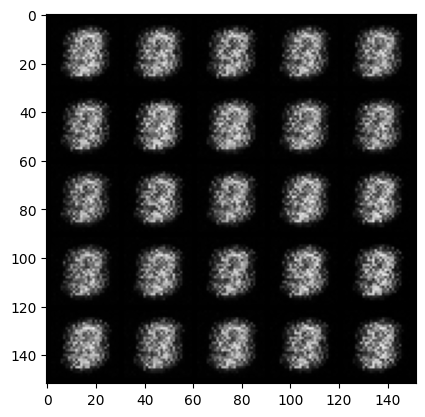

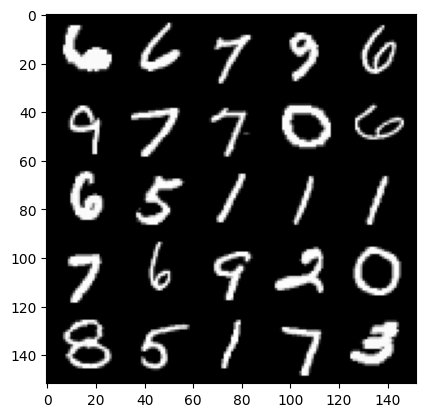

  0%|          | 0/469 [00:00<?, ?it/s]

Step 1000: Generator loss: 1.9516455144882183, discriminator loss: 0.1752225973010064


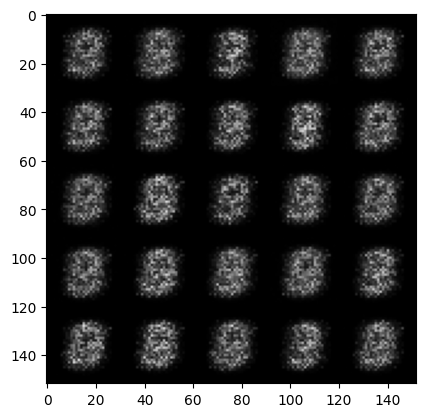

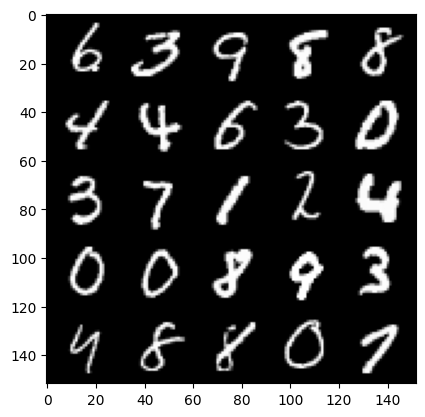

  0%|          | 0/469 [00:00<?, ?it/s]

Step 1500: Generator loss: 1.7735004901886005, discriminator loss: 0.19596830877661695


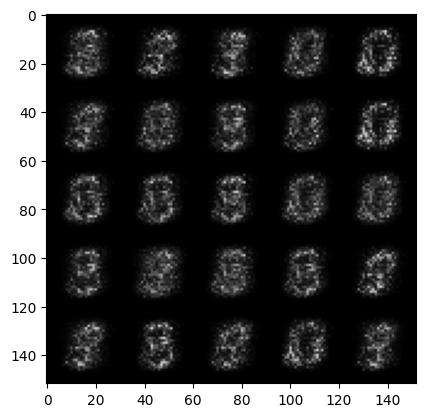

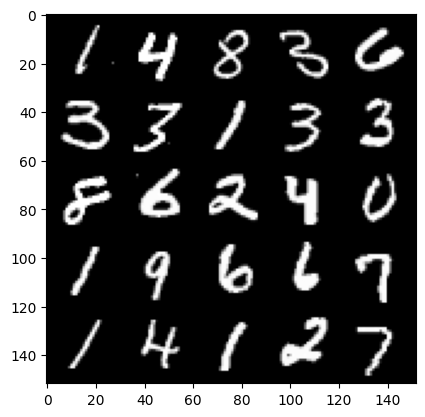

  0%|          | 0/469 [00:00<?, ?it/s]

Step 2000: Generator loss: 1.7421401388645175, discriminator loss: 0.19316820889711359


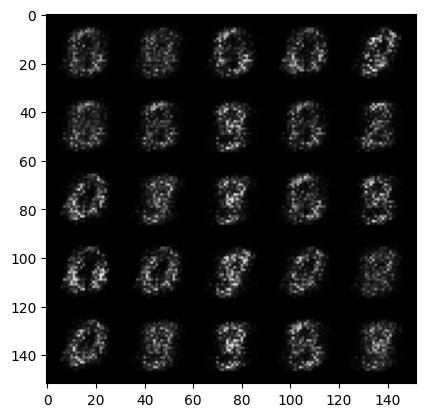

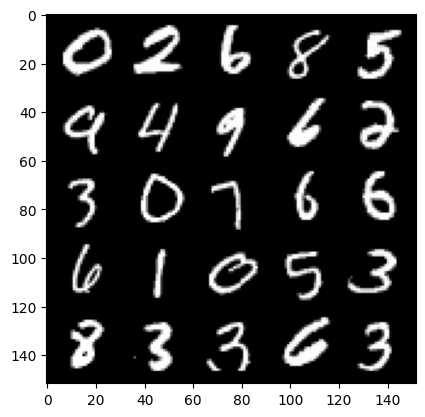

  0%|          | 0/469 [00:00<?, ?it/s]

Step 2500: Generator loss: 2.0543074014186837, discriminator loss: 0.14254586100578312


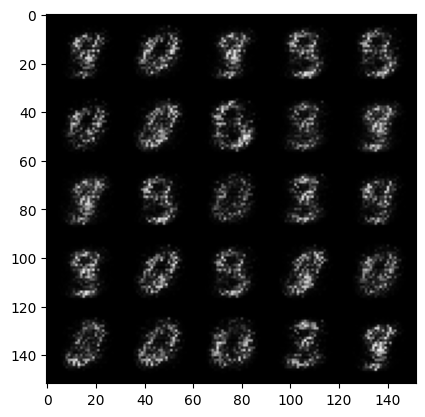

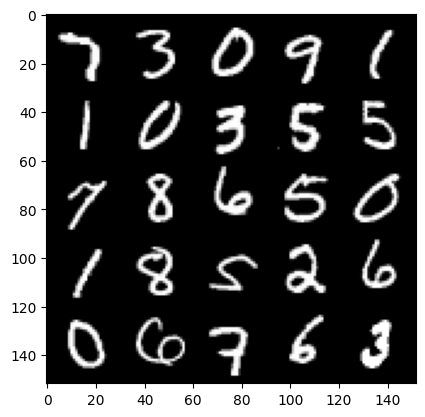

  0%|          | 0/469 [00:00<?, ?it/s]

Step 3000: Generator loss: 2.459366249084474, discriminator loss: 0.12765790081024175


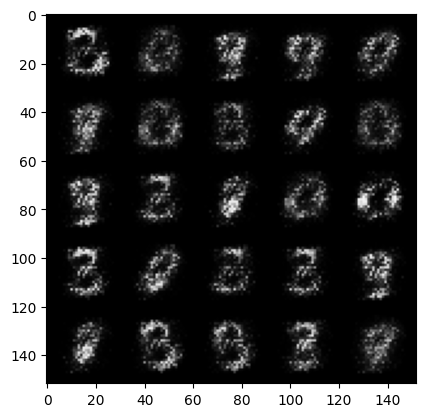

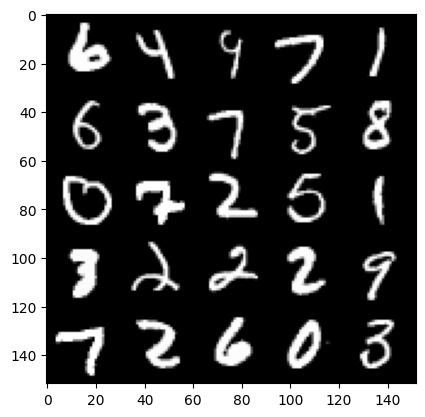

  0%|          | 0/469 [00:00<?, ?it/s]

Step 3500: Generator loss: 2.7236509146690424, discriminator loss: 0.12245820757746692


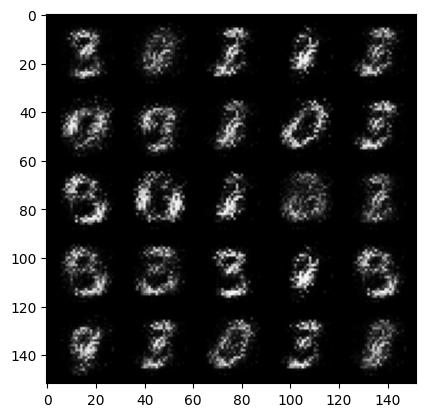

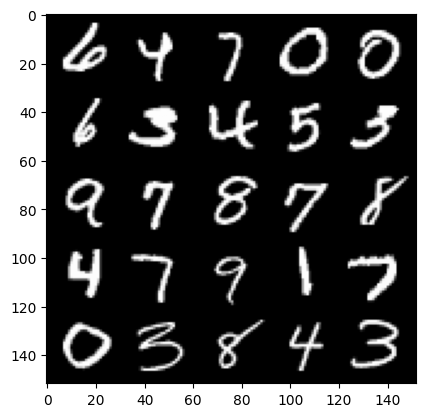

  0%|          | 0/469 [00:00<?, ?it/s]

Step 4000: Generator loss: 3.1111524453163133, discriminator loss: 0.10073086002469063


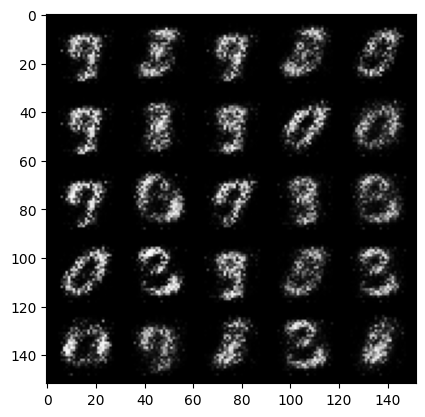

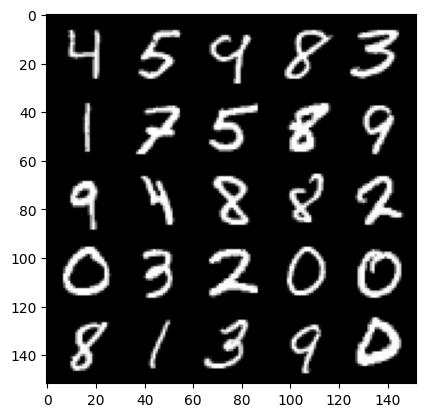

  0%|          | 0/469 [00:00<?, ?it/s]

Step 4500: Generator loss: 3.3516222944259644, discriminator loss: 0.08409764466434726


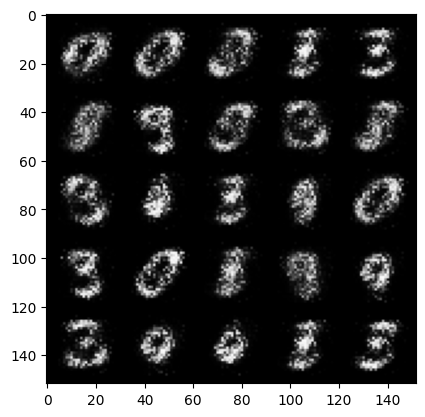

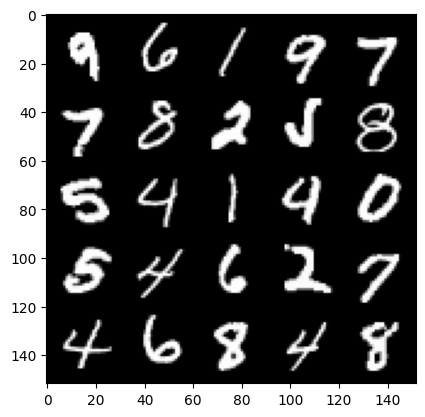

  0%|          | 0/469 [00:00<?, ?it/s]

Step 5000: Generator loss: 3.512768658161165, discriminator loss: 0.08891257178783409


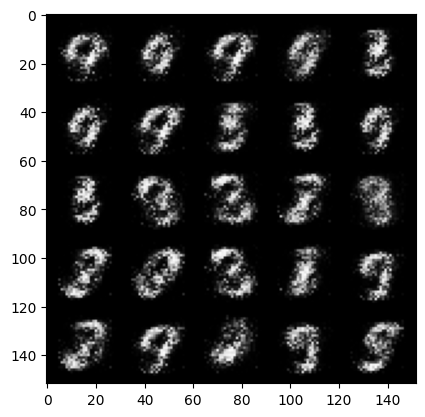

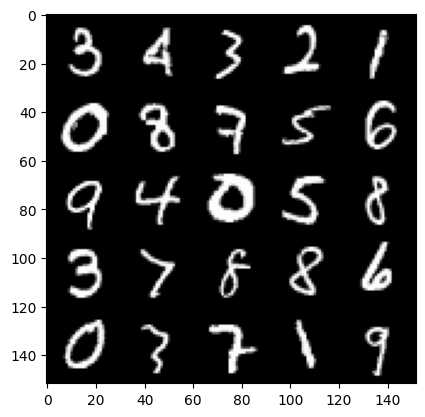

  0%|          | 0/469 [00:00<?, ?it/s]

Step 5500: Generator loss: 3.6654155983924874, discriminator loss: 0.07249782773107288


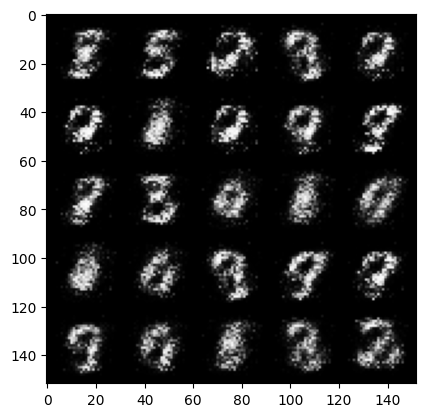

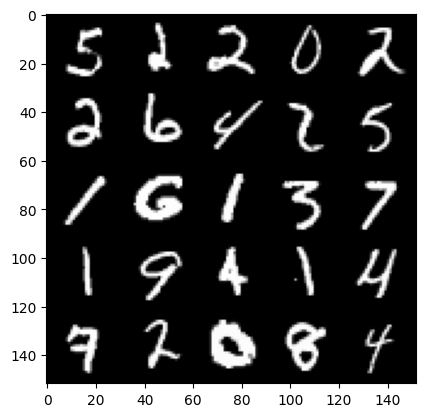

  0%|          | 0/469 [00:00<?, ?it/s]

Step 6000: Generator loss: 3.9486557483673086, discriminator loss: 0.05484713844582439


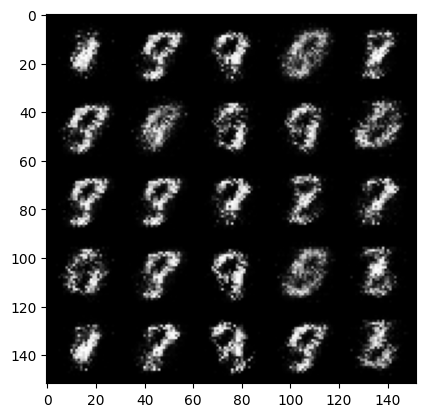

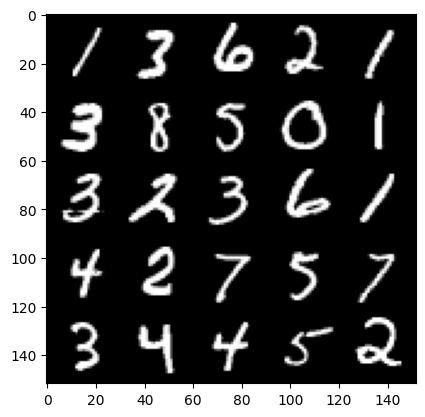

  0%|          | 0/469 [00:00<?, ?it/s]

Step 6500: Generator loss: 3.9008035821914673, discriminator loss: 0.05722511153295634


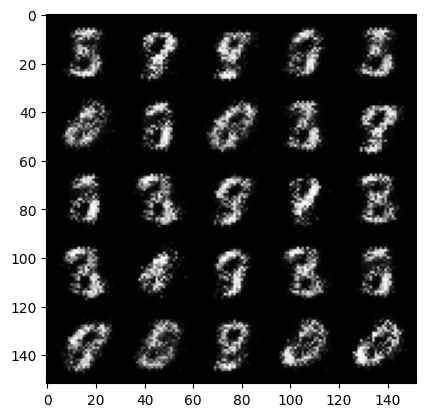

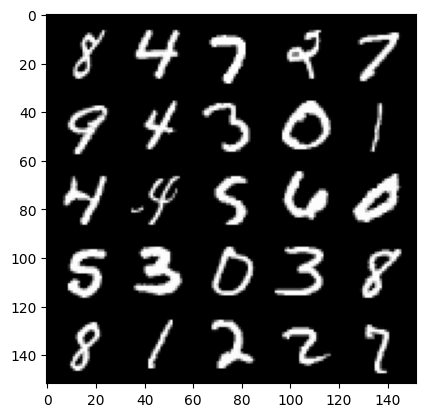

  0%|          | 0/469 [00:00<?, ?it/s]

Step 7000: Generator loss: 4.1312823381423955, discriminator loss: 0.05378344847261907


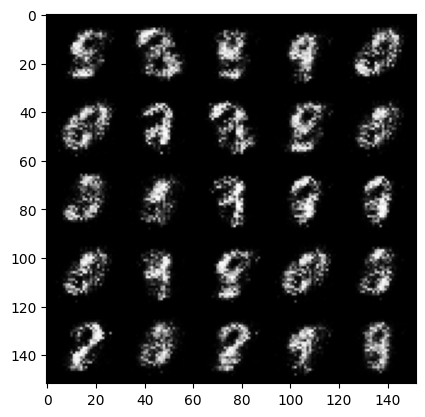

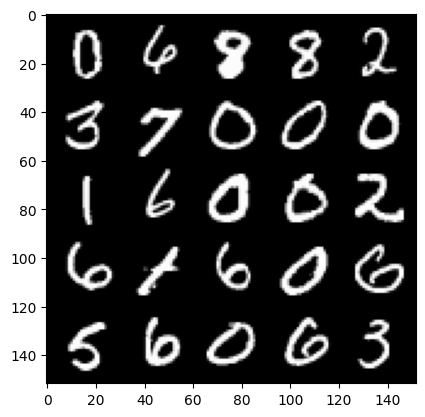

  0%|          | 0/469 [00:00<?, ?it/s]

Step 7500: Generator loss: 4.092491517543794, discriminator loss: 0.061959589213132896


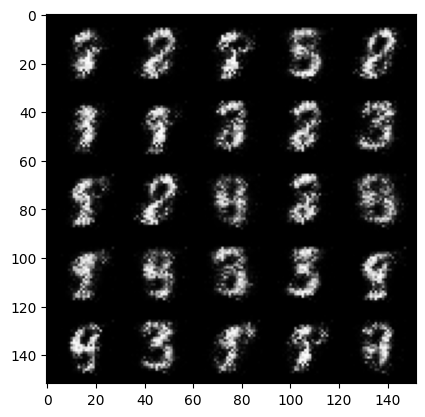

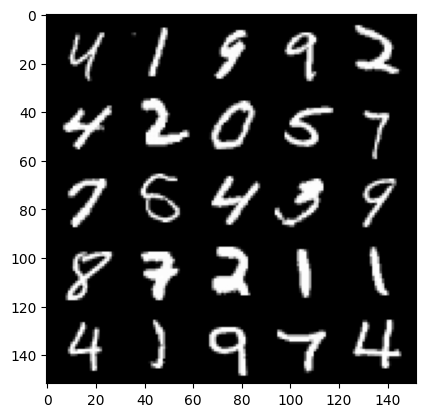

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 8000: Generator loss: 3.8962005538940385, discriminator loss: 0.07493222546577456


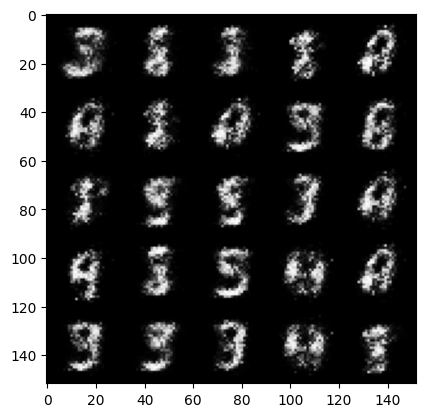

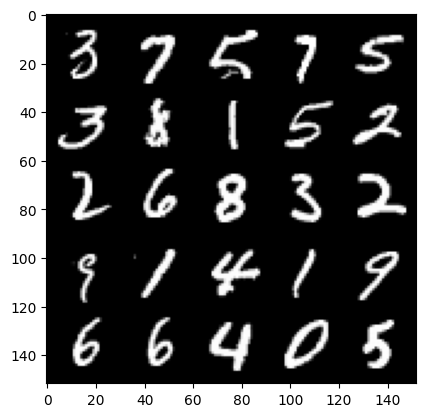

  0%|          | 0/469 [00:00<?, ?it/s]

Step 8500: Generator loss: 3.853533150196079, discriminator loss: 0.0792506441250442


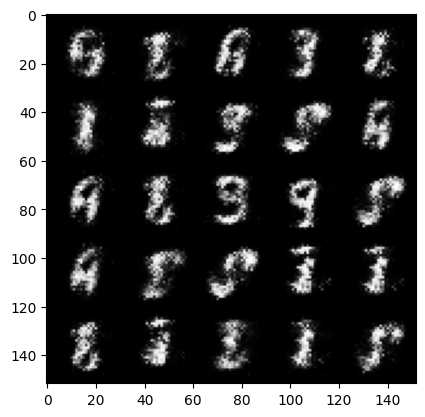

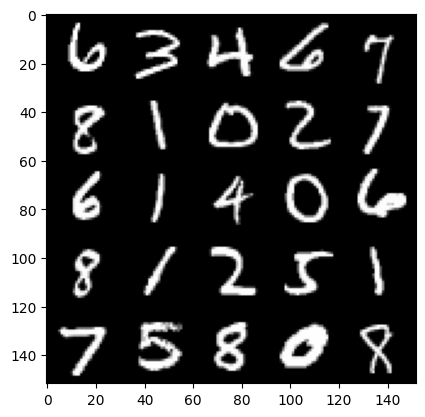

  0%|          | 0/469 [00:00<?, ?it/s]

Step 9000: Generator loss: 3.987134233951568, discriminator loss: 0.06140216603502629


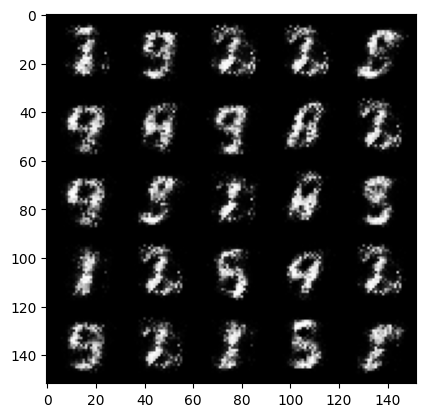

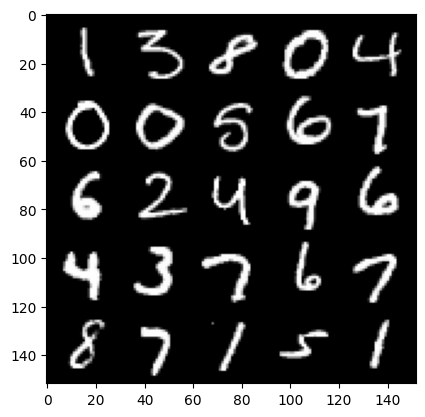

  0%|          | 0/469 [00:00<?, ?it/s]

Step 9500: Generator loss: 4.051492046356204, discriminator loss: 0.05802582598105074


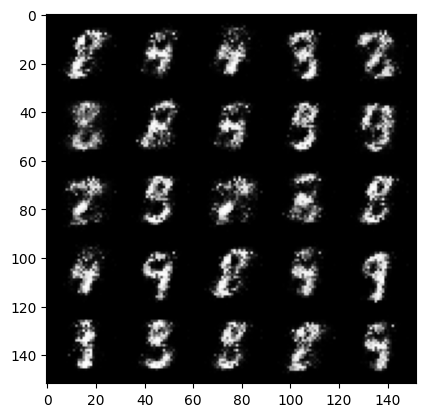

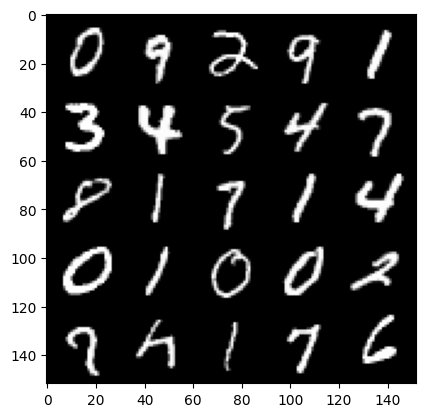

  0%|          | 0/469 [00:00<?, ?it/s]

Step 10000: Generator loss: 4.00751128387451, discriminator loss: 0.060111646626144606


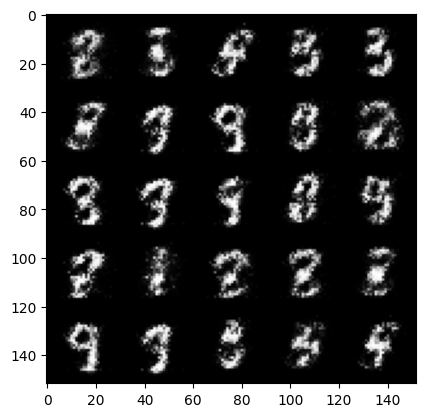

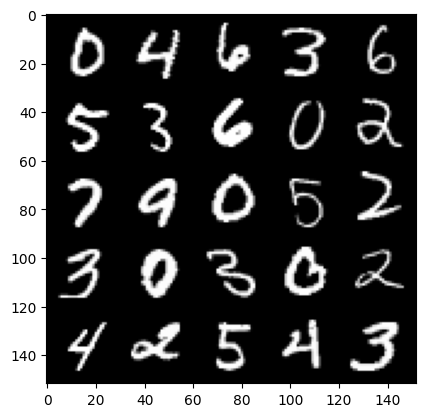

  0%|          | 0/469 [00:00<?, ?it/s]

Step 10500: Generator loss: 4.07023324918747, discriminator loss: 0.058025590870529366


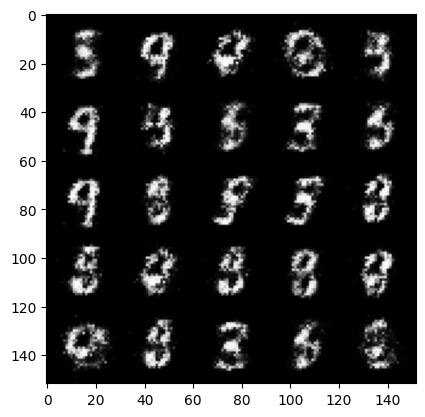

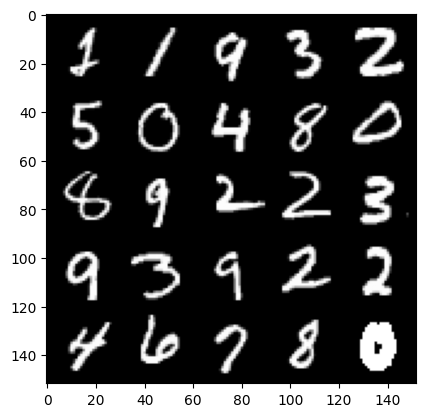

  0%|          | 0/469 [00:00<?, ?it/s]

Step 11000: Generator loss: 3.8925179028511065, discriminator loss: 0.06743024505674834


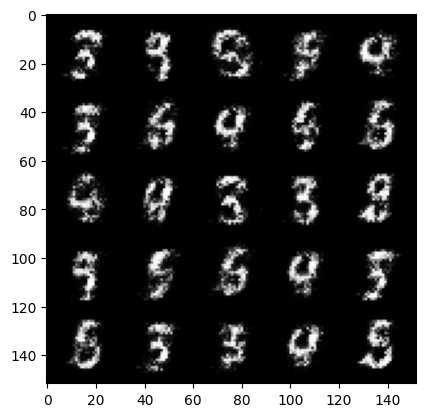

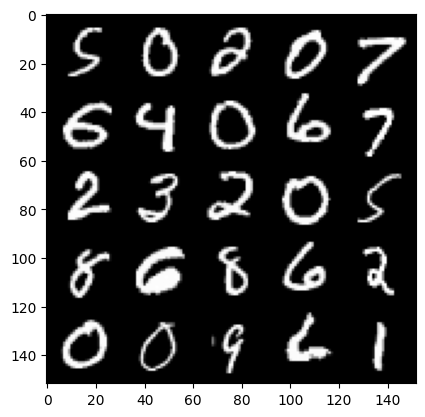

  0%|          | 0/469 [00:00<?, ?it/s]

Step 11500: Generator loss: 3.983477163791654, discriminator loss: 0.06859992874413726


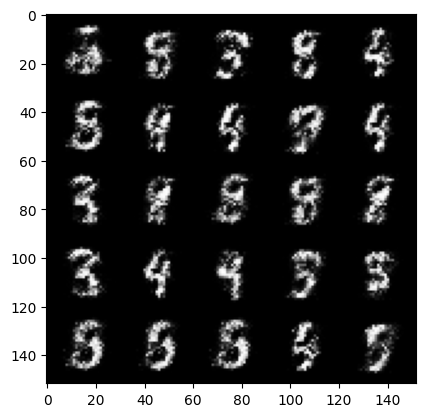

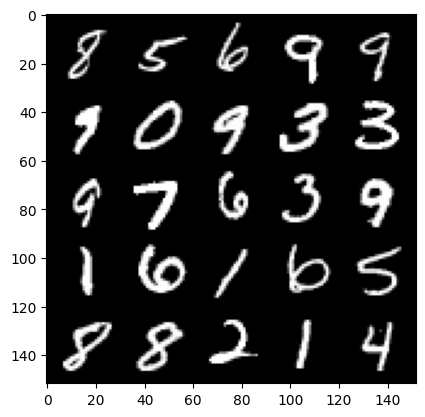

  0%|          | 0/469 [00:00<?, ?it/s]

Step 12000: Generator loss: 3.9246521978378284, discriminator loss: 0.0826419210880995


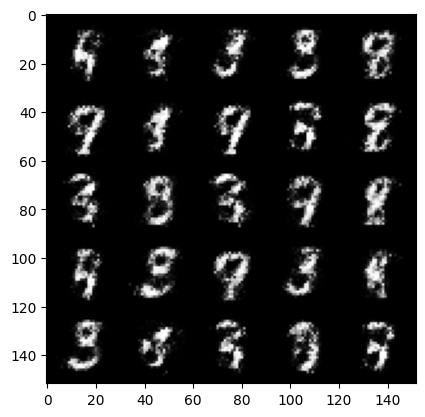

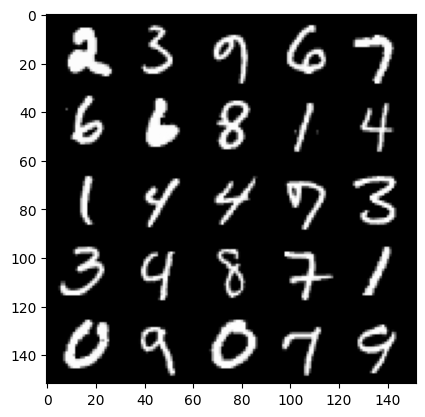

  0%|          | 0/469 [00:00<?, ?it/s]

Step 12500: Generator loss: 3.999748047351833, discriminator loss: 0.08329454535990963


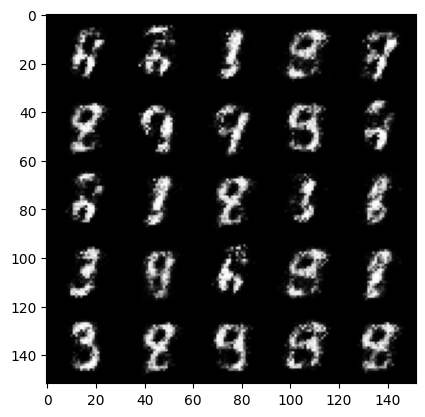

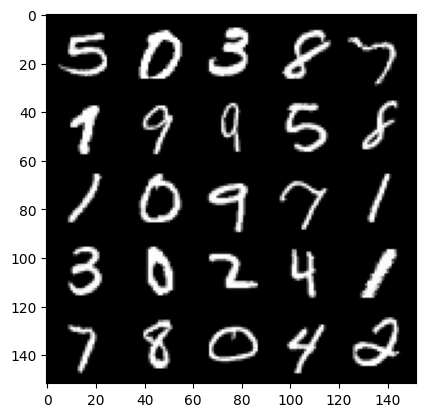

  0%|          | 0/469 [00:00<?, ?it/s]

Step 13000: Generator loss: 3.8145471901893595, discriminator loss: 0.09435671500116592


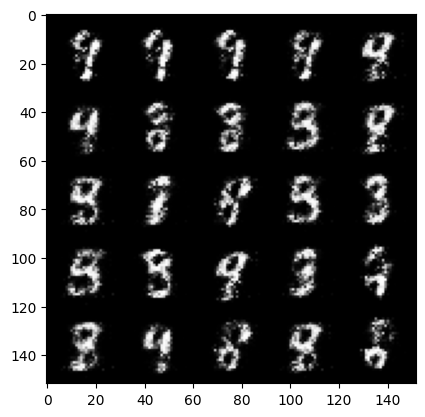

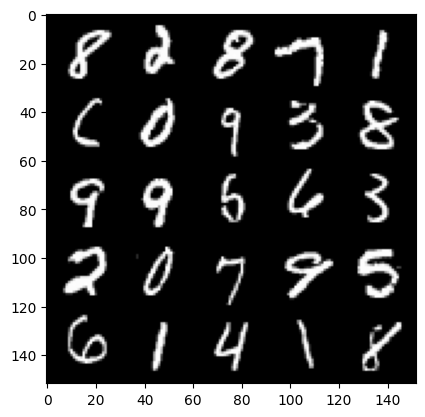

  0%|          | 0/469 [00:00<?, ?it/s]

Step 13500: Generator loss: 3.8626956896781963, discriminator loss: 0.07742873904108998


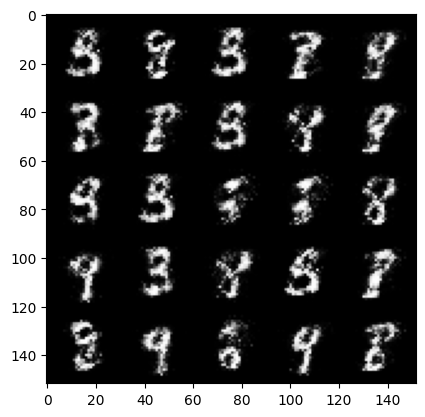

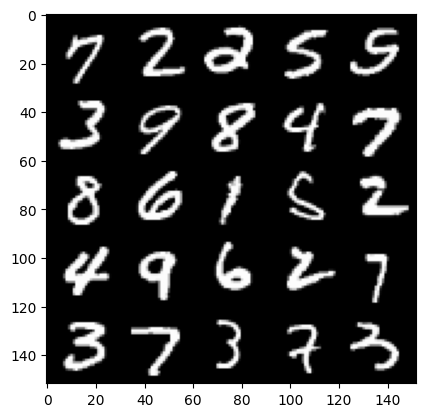

  0%|          | 0/469 [00:00<?, ?it/s]

Step 14000: Generator loss: 3.8134790601730373, discriminator loss: 0.08961325458437198


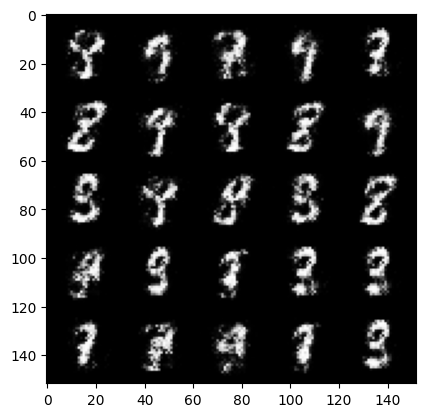

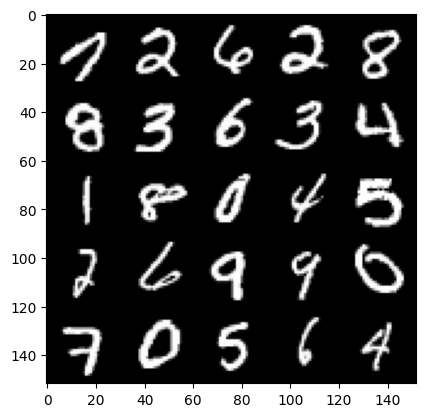

  0%|          | 0/469 [00:00<?, ?it/s]

Step 14500: Generator loss: 3.68838505029678, discriminator loss: 0.10863154017925256


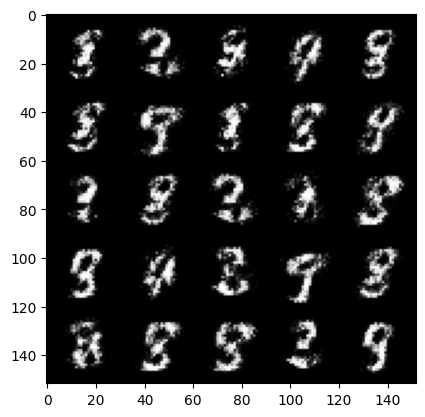

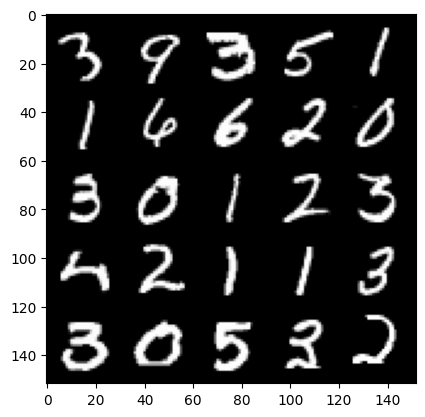

  0%|          | 0/469 [00:00<?, ?it/s]

Step 15000: Generator loss: 3.982683712005616, discriminator loss: 0.08710769820213313


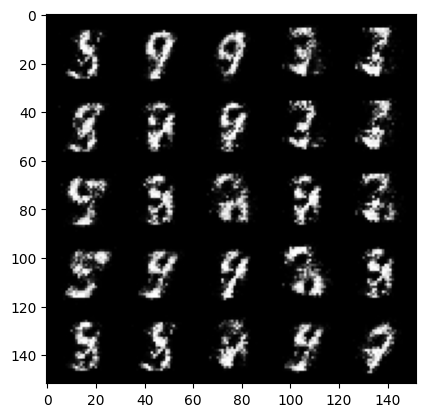

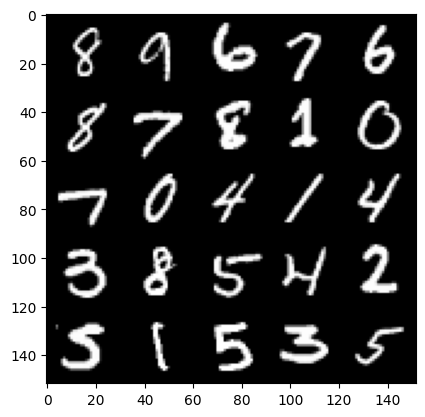

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 15500: Generator loss: 3.9067815465927143, discriminator loss: 0.09252932209521532


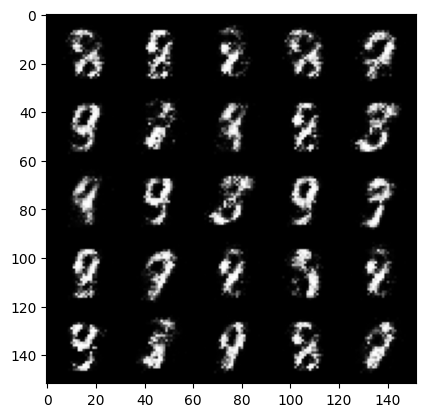

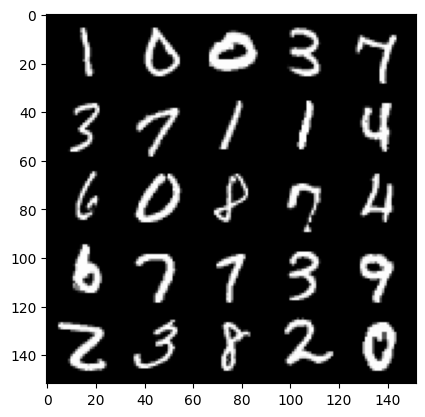

  0%|          | 0/469 [00:00<?, ?it/s]

Step 16000: Generator loss: 3.8046634235382086, discriminator loss: 0.11444086793810129


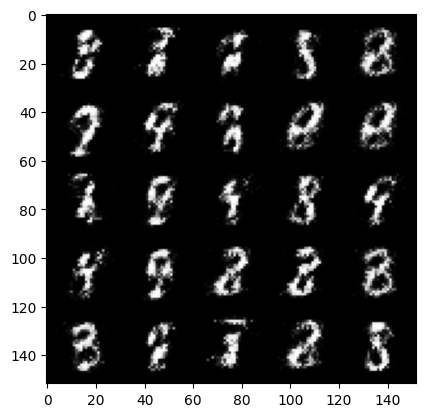

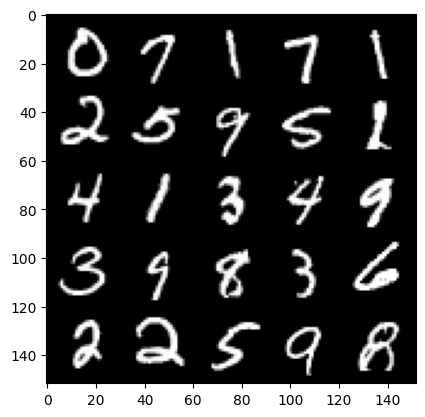

  0%|          | 0/469 [00:00<?, ?it/s]

Step 16500: Generator loss: 3.7468627672195414, discriminator loss: 0.1142676406502723


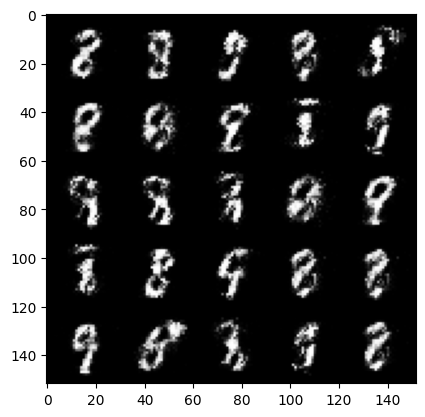

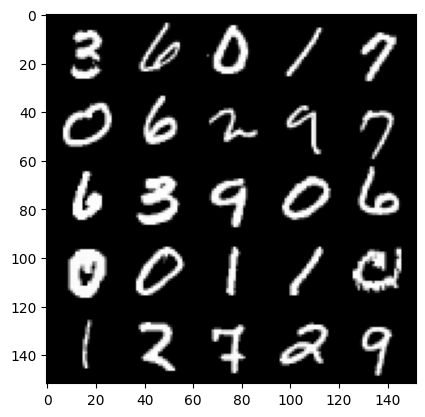

  0%|          | 0/469 [00:00<?, ?it/s]

Step 17000: Generator loss: 3.6463243088722197, discriminator loss: 0.11535971127450453


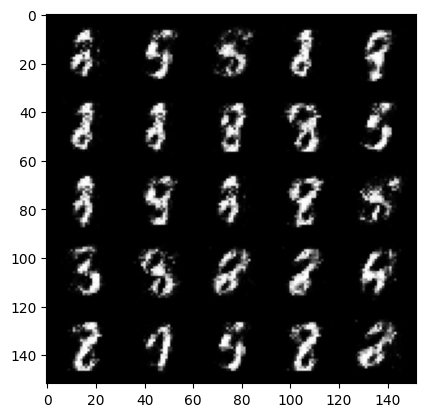

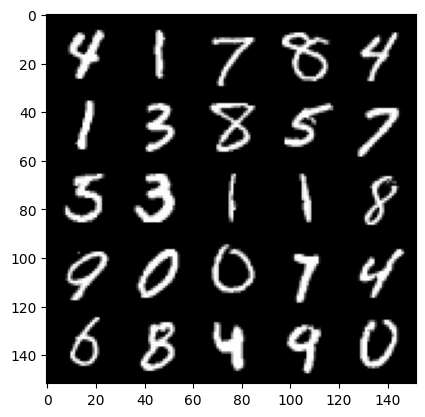

  0%|          | 0/469 [00:00<?, ?it/s]

Step 17500: Generator loss: 3.7057349748611434, discriminator loss: 0.10261681146919728


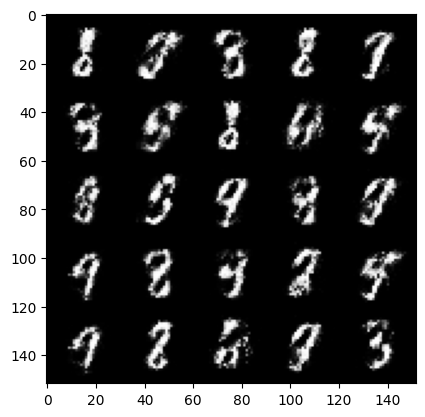

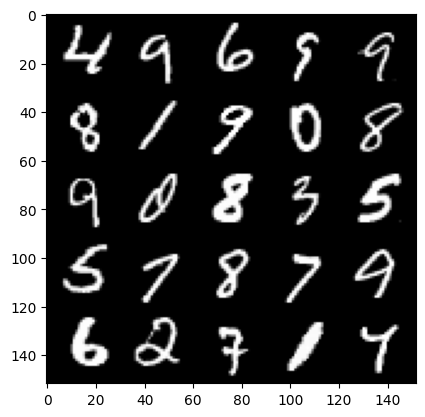

  0%|          | 0/469 [00:00<?, ?it/s]

Step 18000: Generator loss: 3.8810796847343436, discriminator loss: 0.10365312154591085


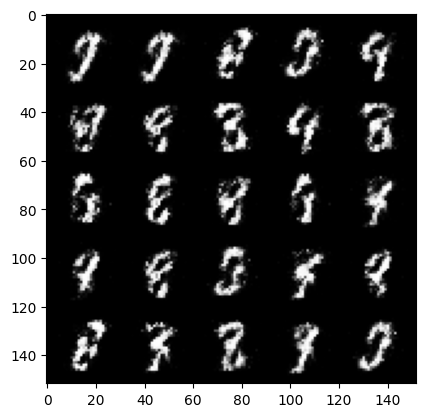

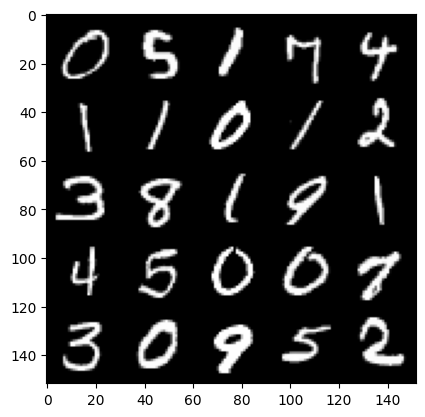

  0%|          | 0/469 [00:00<?, ?it/s]

Step 18500: Generator loss: 3.641326634407042, discriminator loss: 0.11948574296385041


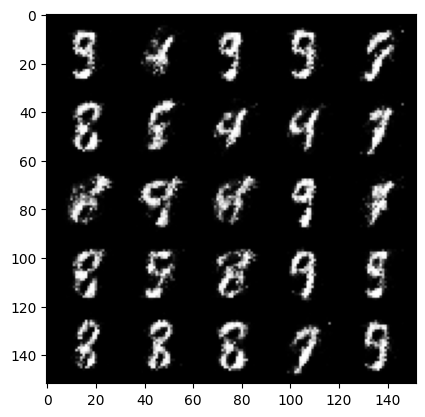

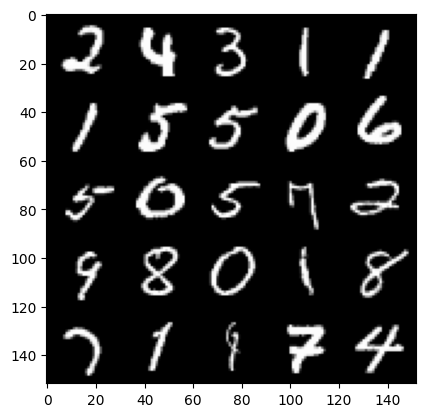

  0%|          | 0/469 [00:00<?, ?it/s]

Step 19000: Generator loss: 3.5489167304038998, discriminator loss: 0.11642693154513845


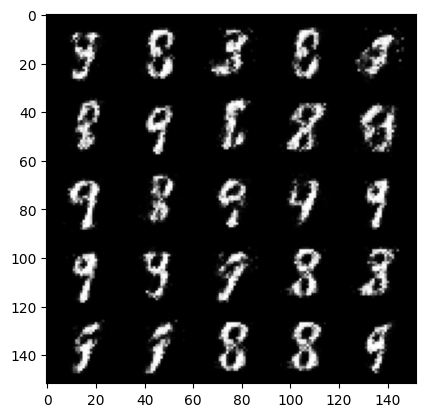

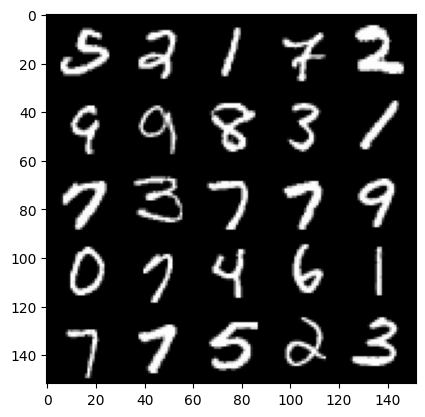

  0%|          | 0/469 [00:00<?, ?it/s]

Step 19500: Generator loss: 3.4625912003517154, discriminator loss: 0.13356272986531256


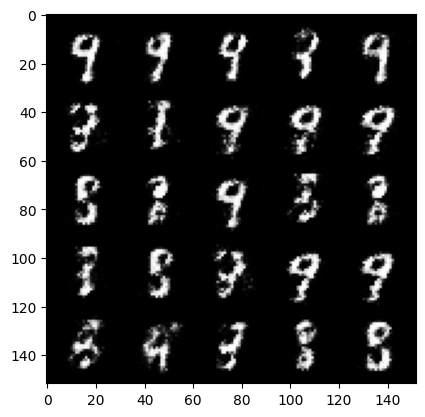

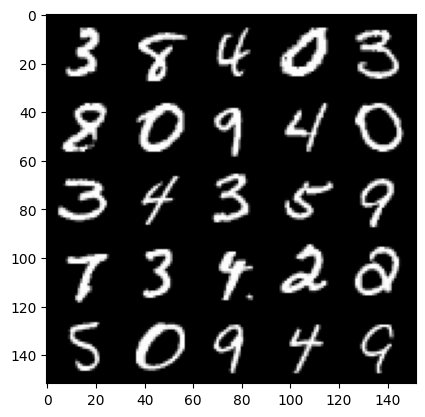

  0%|          | 0/469 [00:00<?, ?it/s]

Step 20000: Generator loss: 3.4319069137573233, discriminator loss: 0.1379660242199898


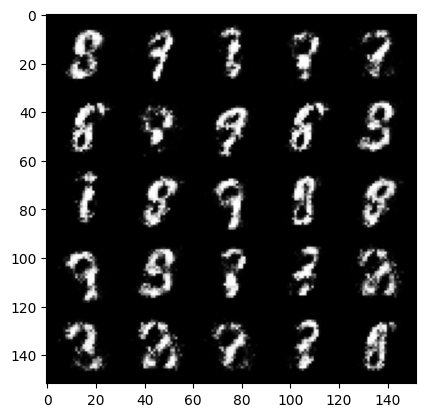

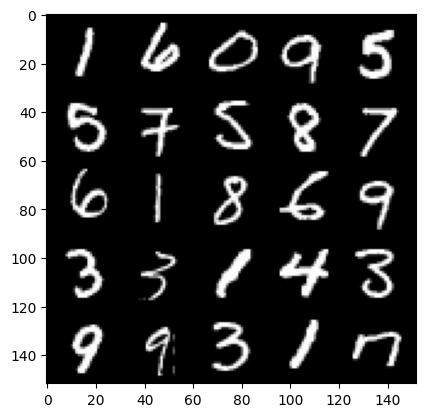

  0%|          | 0/469 [00:00<?, ?it/s]

Step 20500: Generator loss: 3.371512105464935, discriminator loss: 0.1363044224083424


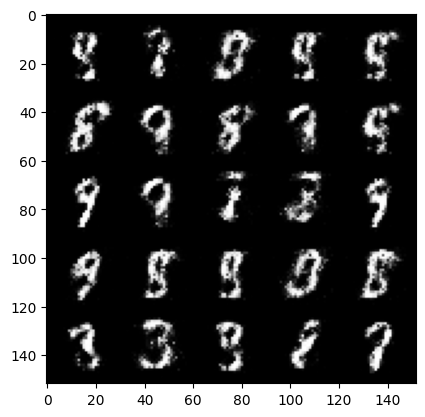

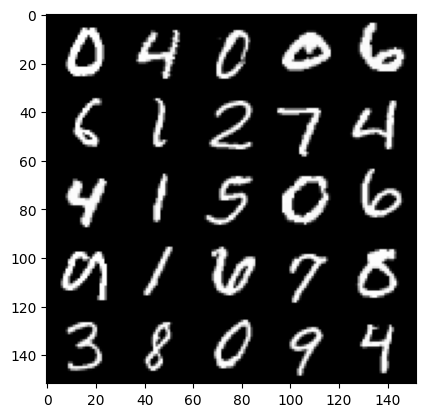

  0%|          | 0/469 [00:00<?, ?it/s]

Step 21000: Generator loss: 3.3003982124328637, discriminator loss: 0.14909207801520816


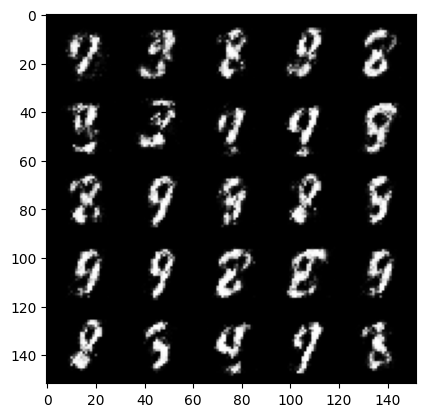

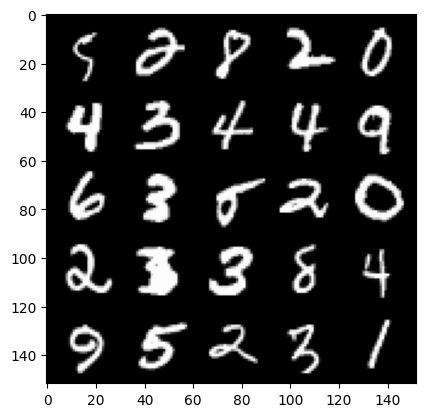

  0%|          | 0/469 [00:00<?, ?it/s]

Step 21500: Generator loss: 3.1755756416320775, discriminator loss: 0.16276891237497326


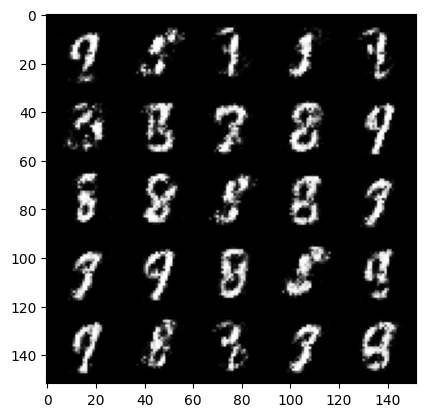

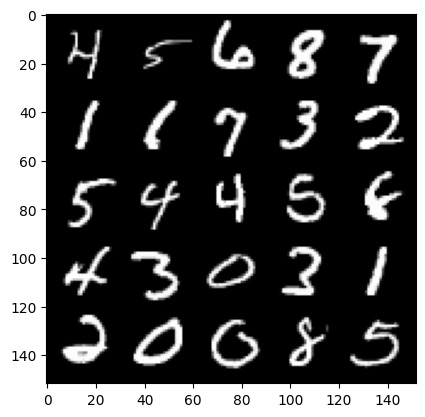

  0%|          | 0/469 [00:00<?, ?it/s]

Step 22000: Generator loss: 3.0435904974937444, discriminator loss: 0.17059420996904393


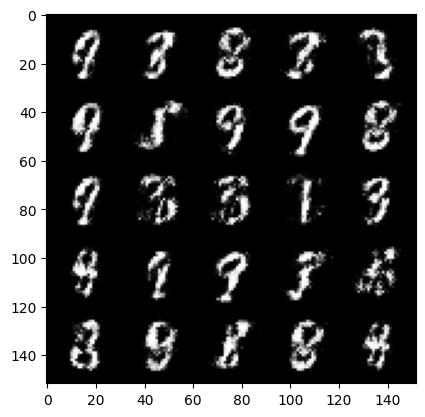

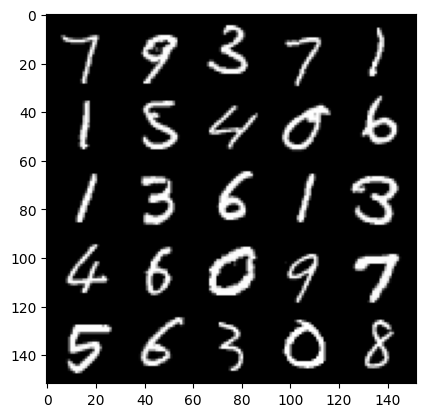

  0%|          | 0/469 [00:00<?, ?it/s]

Step 22500: Generator loss: 2.984207212924959, discriminator loss: 0.1853488648086787


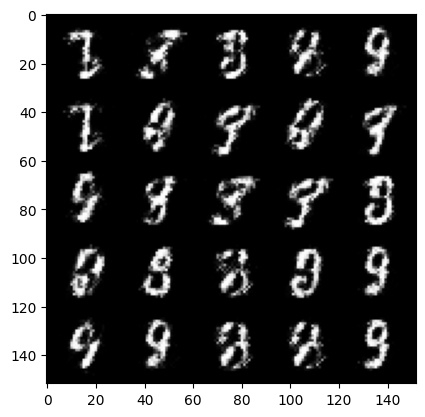

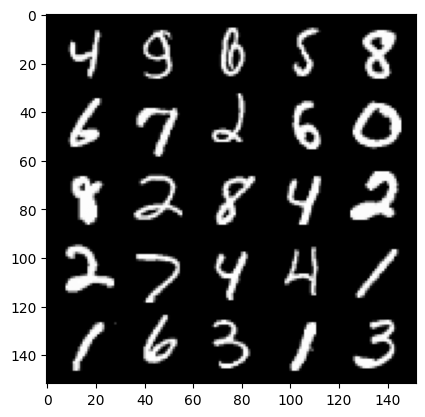

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 23000: Generator loss: 3.019436350345611, discriminator loss: 0.16631901532411578


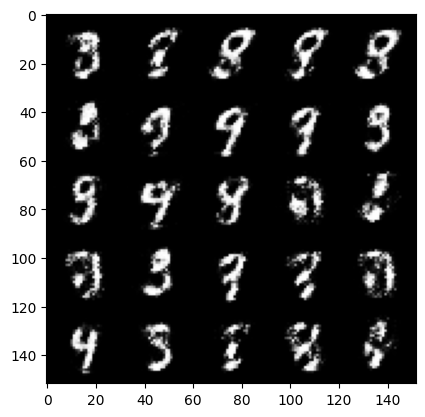

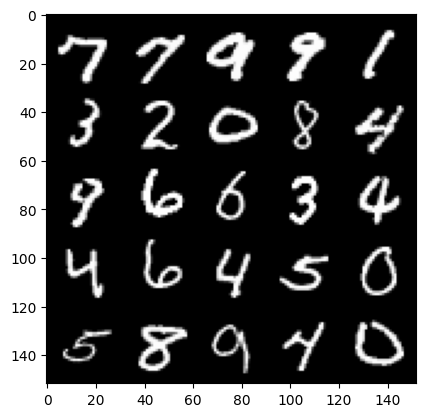

  0%|          | 0/469 [00:00<?, ?it/s]

Step 23500: Generator loss: 2.9961686902046227, discriminator loss: 0.17216286063194275


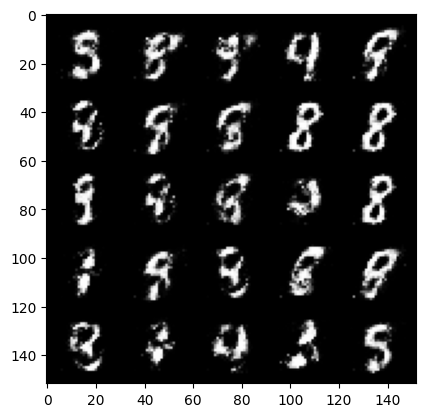

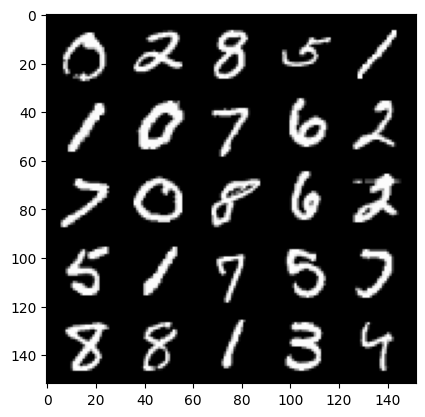

  0%|          | 0/469 [00:00<?, ?it/s]

Step 24000: Generator loss: 3.030042081356049, discriminator loss: 0.1896980116963387


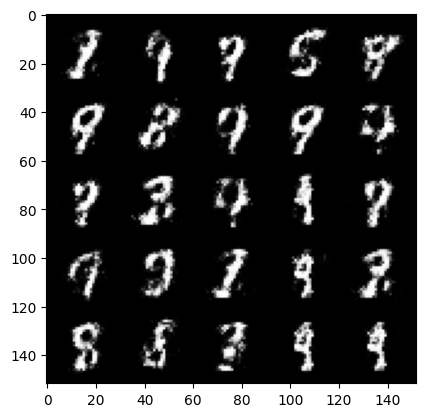

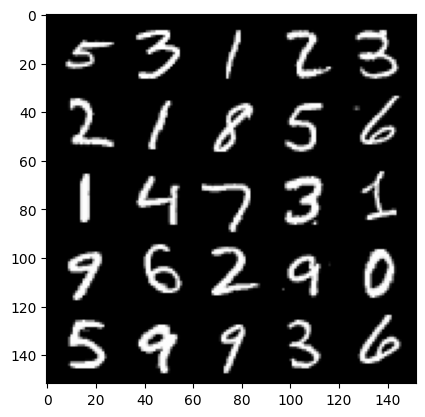

  0%|          | 0/469 [00:00<?, ?it/s]

Step 24500: Generator loss: 3.03158673477173, discriminator loss: 0.18245497806370242


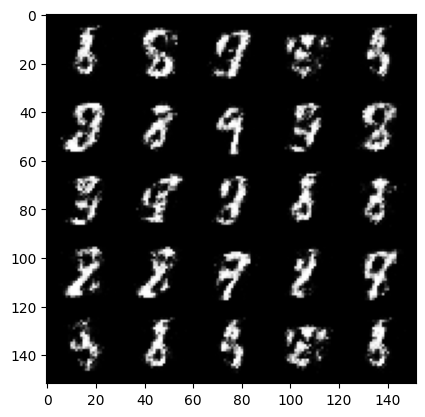

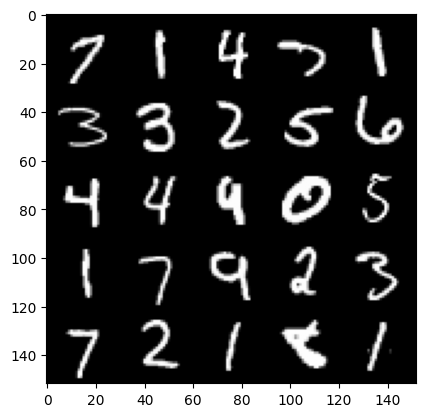

  0%|          | 0/469 [00:00<?, ?it/s]

Step 25000: Generator loss: 2.9420041203498863, discriminator loss: 0.19414449498057382


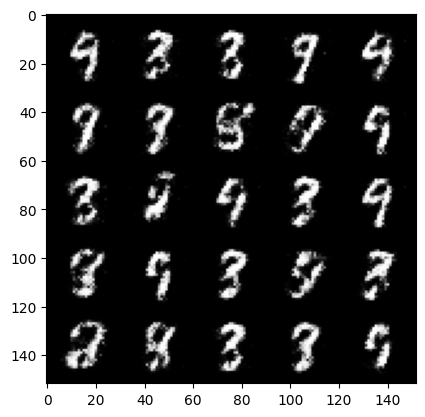

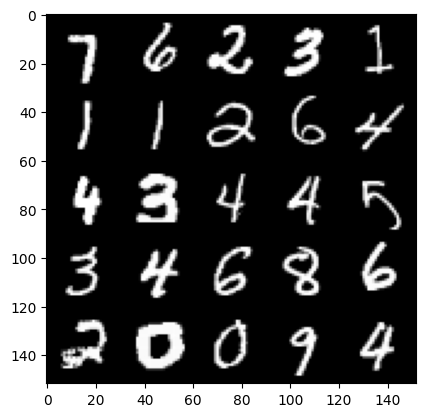

  0%|          | 0/469 [00:00<?, ?it/s]

Step 25500: Generator loss: 2.9816060581207275, discriminator loss: 0.181519242286682


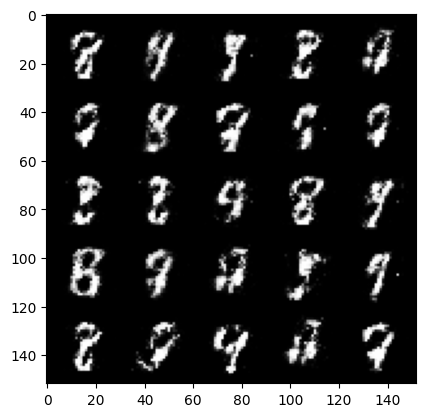

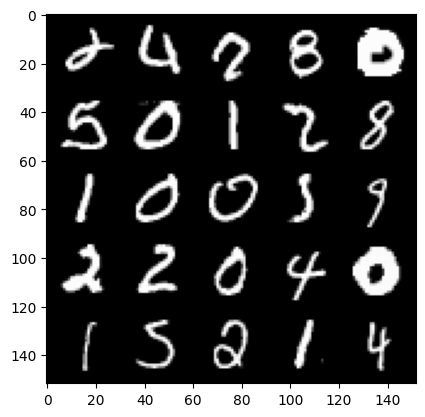

  0%|          | 0/469 [00:00<?, ?it/s]

Step 26000: Generator loss: 3.007407337188721, discriminator loss: 0.17964699034392853


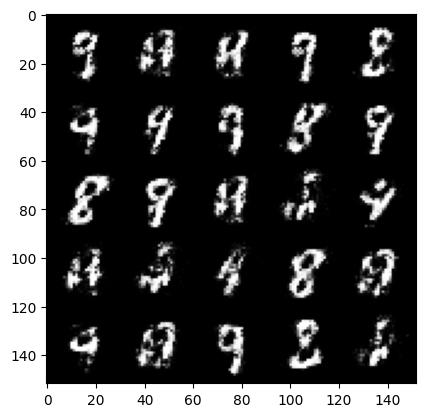

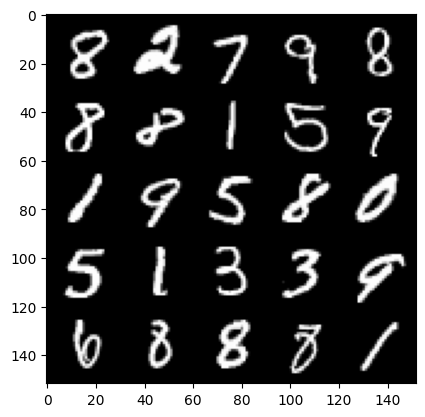

  0%|          | 0/469 [00:00<?, ?it/s]

Step 26500: Generator loss: 2.869593569278718, discriminator loss: 0.2182307449728251


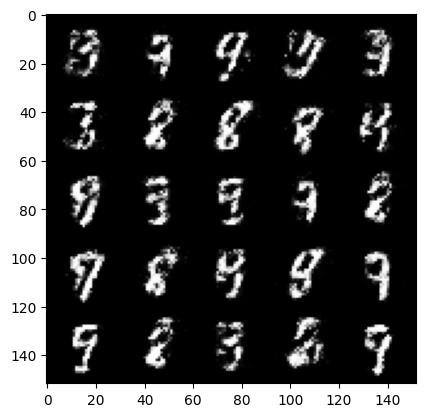

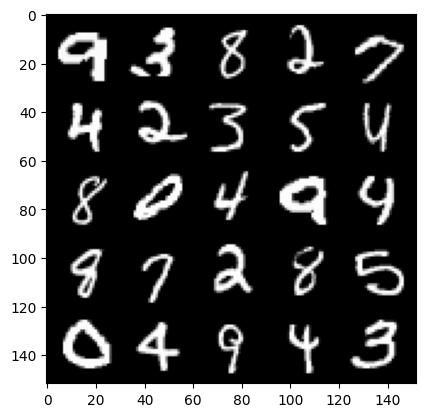

  0%|          | 0/469 [00:00<?, ?it/s]

Step 27000: Generator loss: 2.929339216709135, discriminator loss: 0.2054748727083207


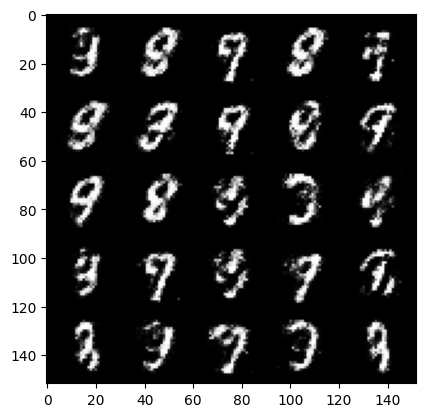

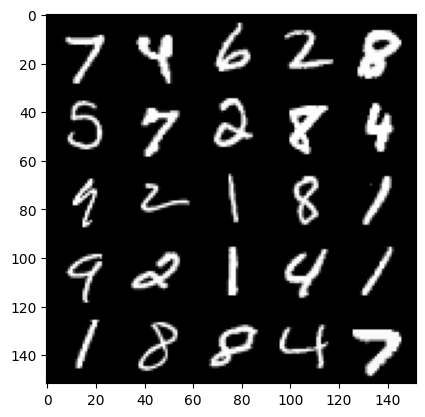

  0%|          | 0/469 [00:00<?, ?it/s]

Step 27500: Generator loss: 2.909422663211823, discriminator loss: 0.2053700243085622


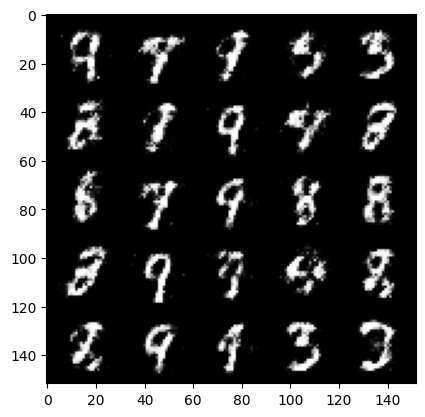

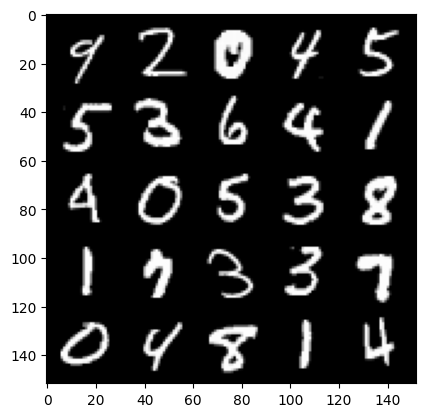

  0%|          | 0/469 [00:00<?, ?it/s]

Step 28000: Generator loss: 2.831162634849547, discriminator loss: 0.2259418551325796


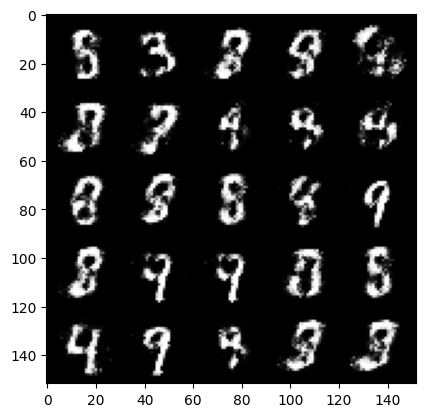

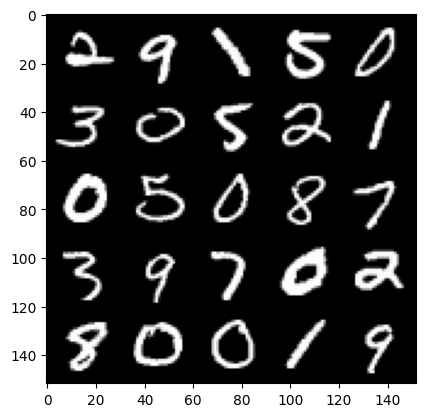

  0%|          | 0/469 [00:00<?, ?it/s]

Step 28500: Generator loss: 2.591876052141192, discriminator loss: 0.24933017906546584


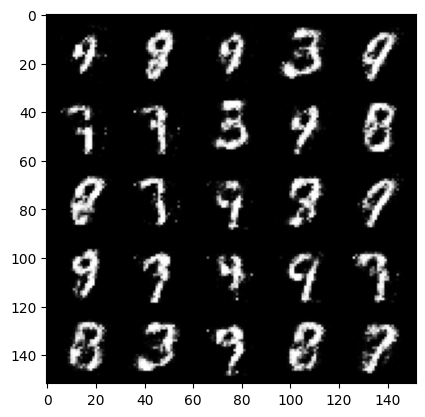

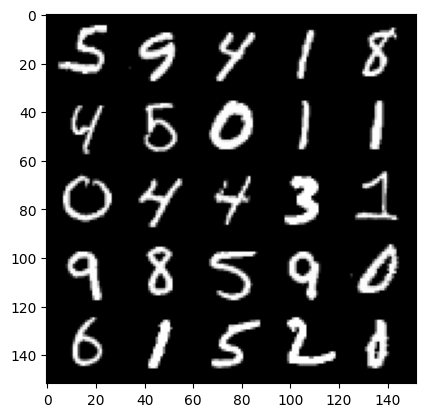

  0%|          | 0/469 [00:00<?, ?it/s]

Step 29000: Generator loss: 2.6661953444480884, discriminator loss: 0.22496993979811675


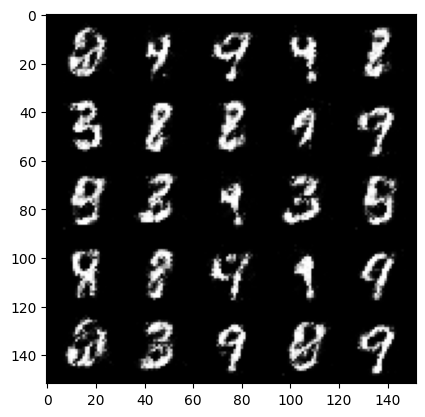

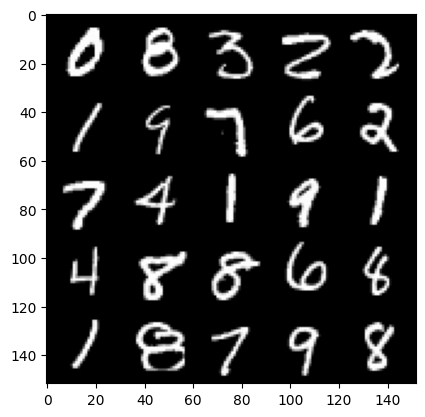

  0%|          | 0/469 [00:00<?, ?it/s]

Step 29500: Generator loss: 2.7129943933486946, discriminator loss: 0.21284154459834062


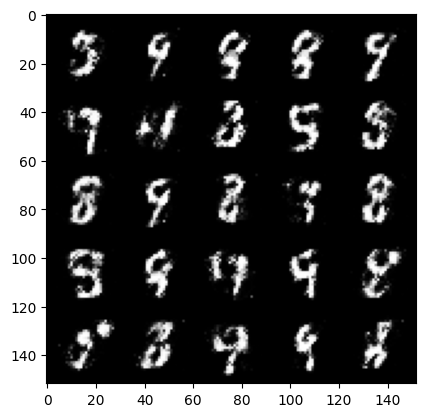

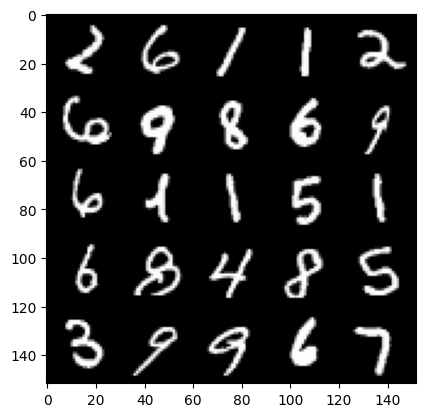

  0%|          | 0/469 [00:00<?, ?it/s]

Step 30000: Generator loss: 2.557559114933016, discriminator loss: 0.23720867688953856


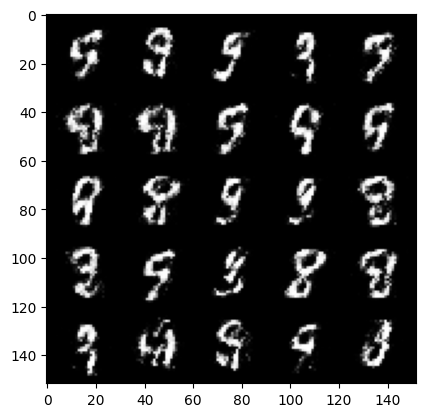

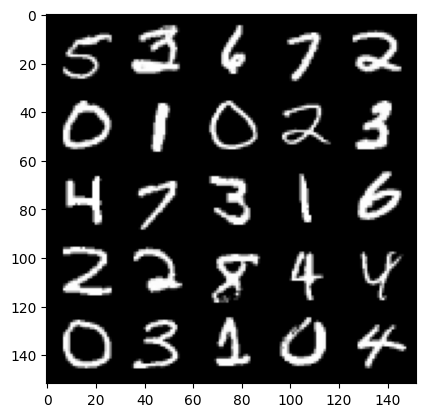

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 30500: Generator loss: 2.673627029418944, discriminator loss: 0.2122715147137642


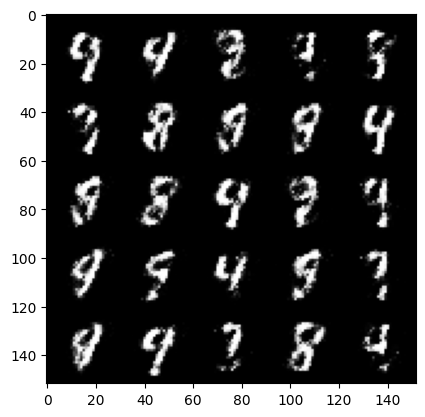

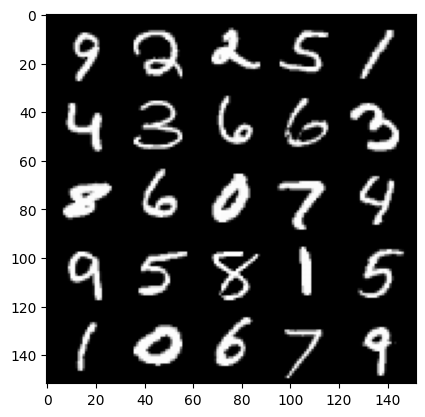

  0%|          | 0/469 [00:00<?, ?it/s]

Step 31000: Generator loss: 2.6734301900863664, discriminator loss: 0.2197108759284019


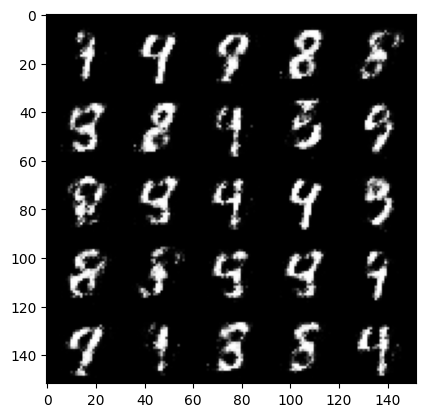

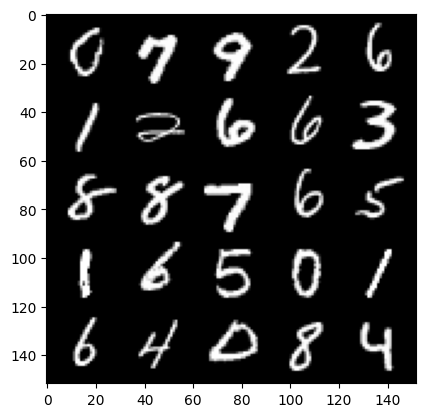

  0%|          | 0/469 [00:00<?, ?it/s]

Step 31500: Generator loss: 2.5406845593452463, discriminator loss: 0.22795341387391055


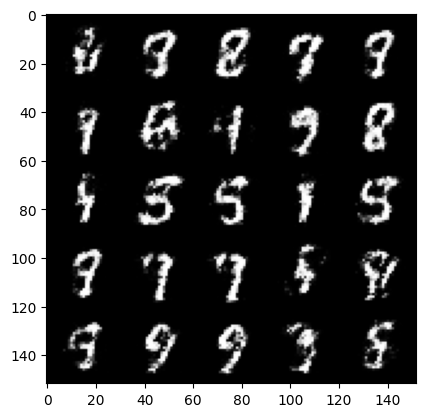

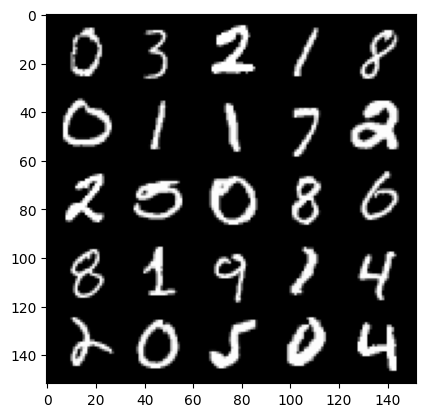

  0%|          | 0/469 [00:00<?, ?it/s]

Step 32000: Generator loss: 2.6519163222312936, discriminator loss: 0.22426747933030142


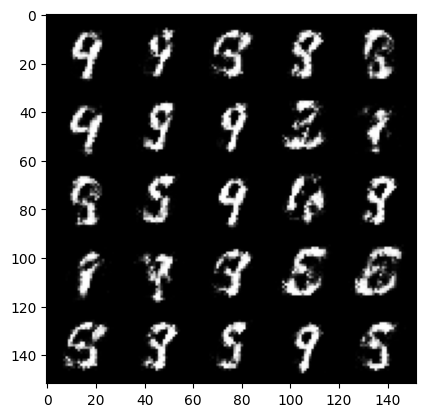

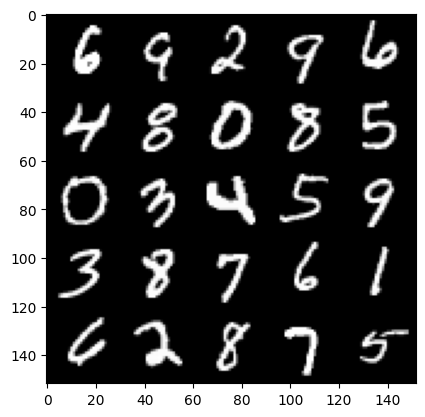

  0%|          | 0/469 [00:00<?, ?it/s]

Step 32500: Generator loss: 2.7158123245239274, discriminator loss: 0.21223422563076028


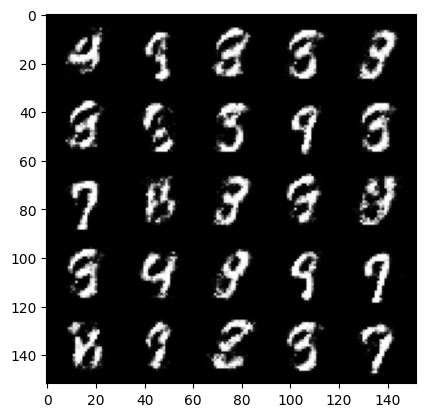

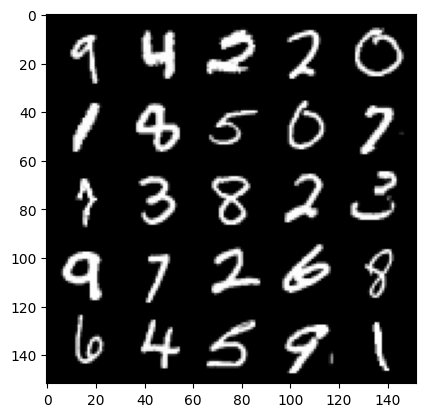

  0%|          | 0/469 [00:00<?, ?it/s]

Step 33000: Generator loss: 2.6029391021728507, discriminator loss: 0.2266903108209371


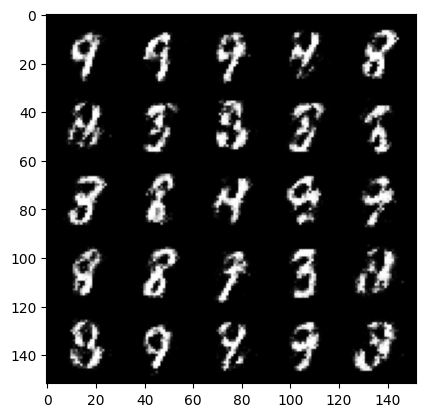

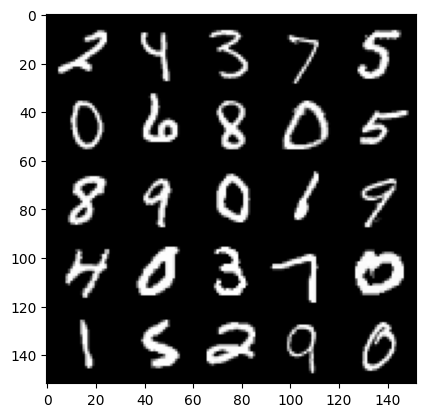

  0%|          | 0/469 [00:00<?, ?it/s]

Step 33500: Generator loss: 2.534618197441098, discriminator loss: 0.24144201019406297


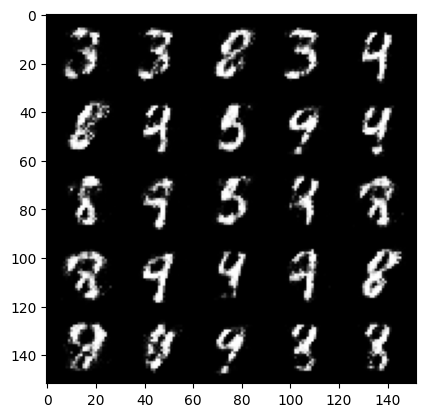

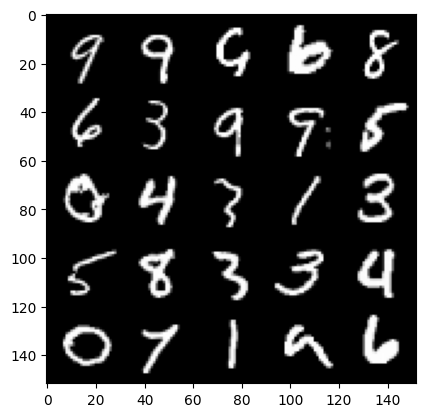

  0%|          | 0/469 [00:00<?, ?it/s]

Step 34000: Generator loss: 2.5212401523590096, discriminator loss: 0.24125389727950106


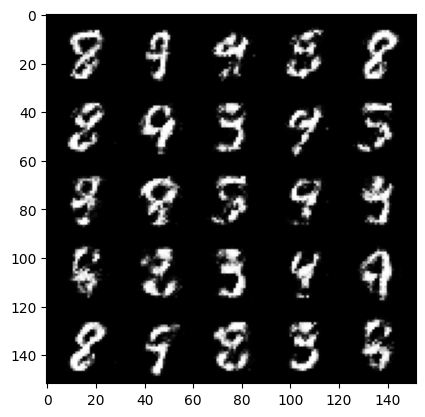

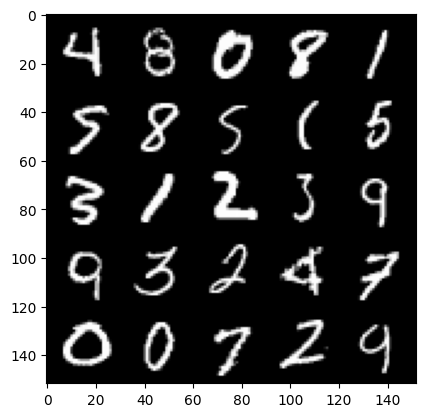

  0%|          | 0/469 [00:00<?, ?it/s]

Step 34500: Generator loss: 2.4867639031410196, discriminator loss: 0.2519501776397229


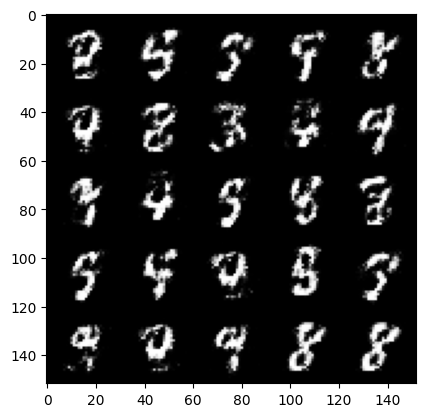

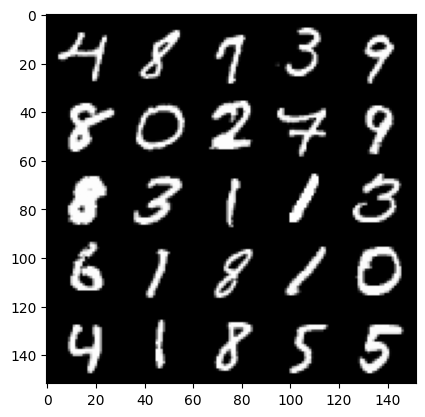

  0%|          | 0/469 [00:00<?, ?it/s]

Step 35000: Generator loss: 2.443706491947175, discriminator loss: 0.24718435356020915


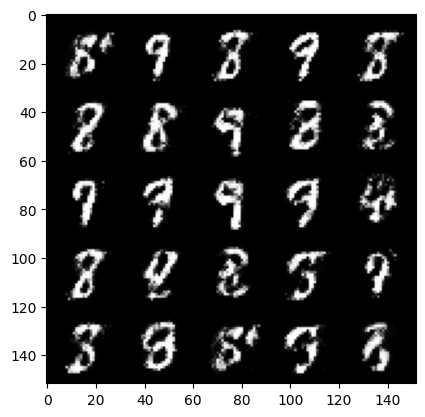

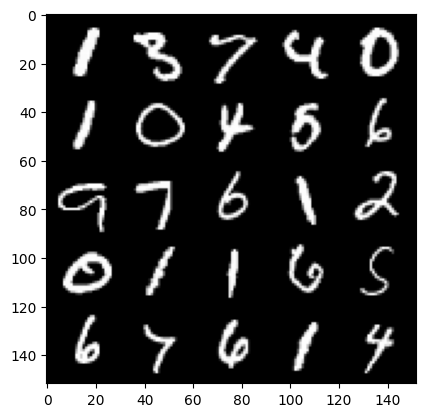

  0%|          | 0/469 [00:00<?, ?it/s]

Step 35500: Generator loss: 2.451983659982682, discriminator loss: 0.25312231752276415


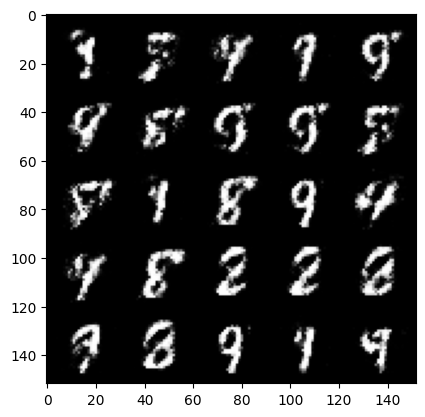

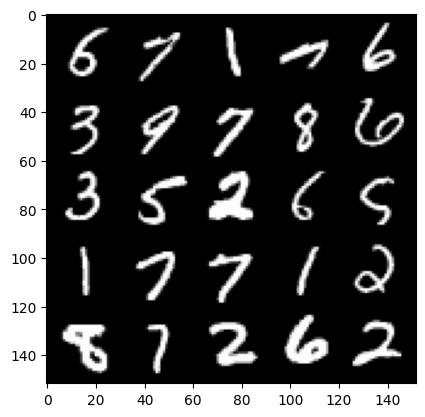

  0%|          | 0/469 [00:00<?, ?it/s]

Step 36000: Generator loss: 2.3763947374820726, discriminator loss: 0.2578727487027645


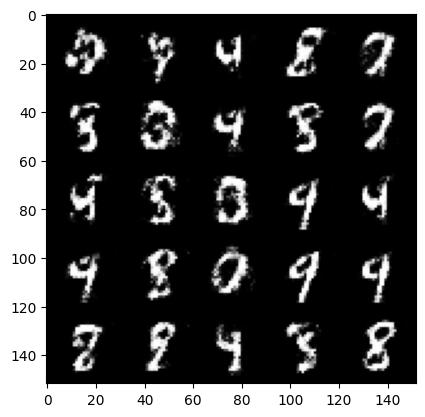

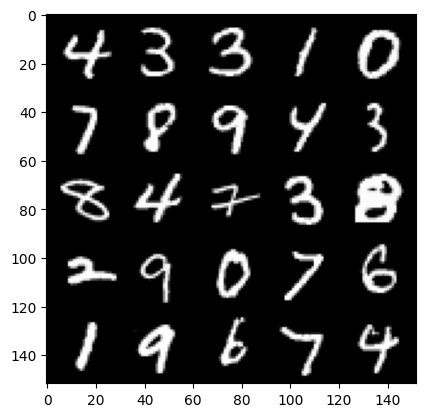

  0%|          | 0/469 [00:00<?, ?it/s]

Step 36500: Generator loss: 2.330447155475617, discriminator loss: 0.27256169652938833


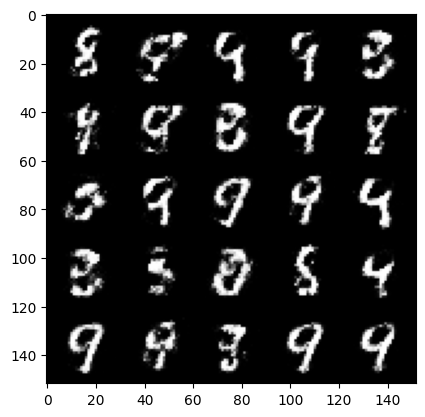

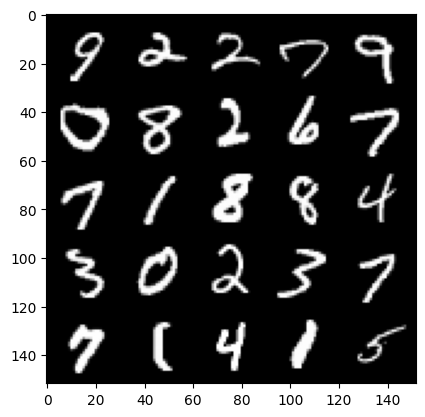

  0%|          | 0/469 [00:00<?, ?it/s]

Step 37000: Generator loss: 2.373207057714464, discriminator loss: 0.24899093300104144


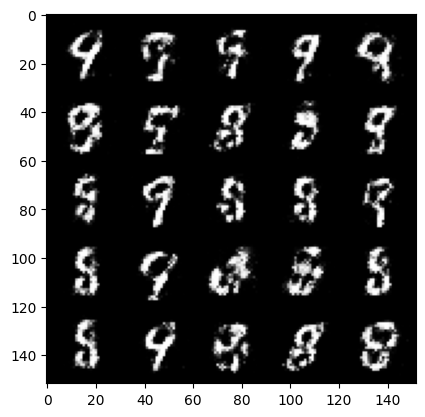

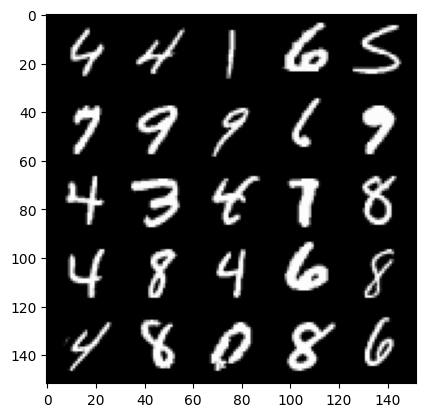

  0%|          | 0/469 [00:00<?, ?it/s]

Step 37500: Generator loss: 2.423869506835937, discriminator loss: 0.2503006171584131


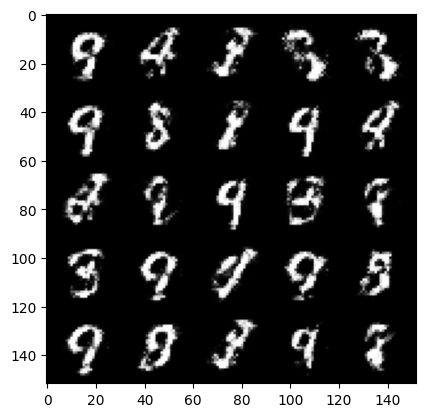

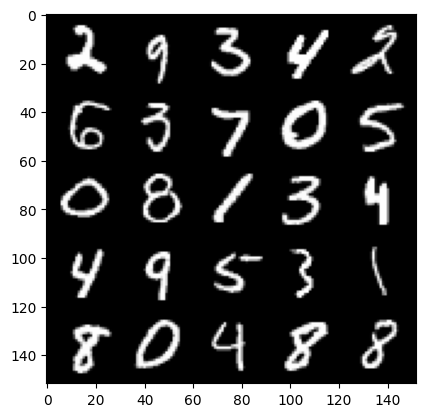

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 38000: Generator loss: 2.5523335289955145, discriminator loss: 0.23615169858932497


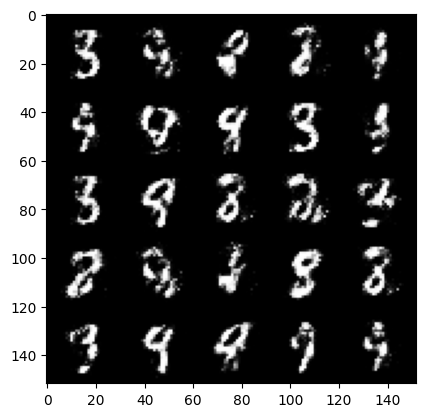

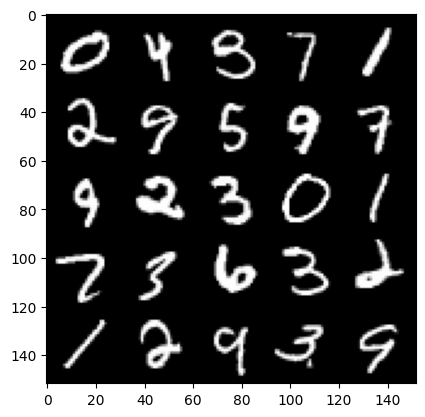

  0%|          | 0/469 [00:00<?, ?it/s]

Step 38500: Generator loss: 2.455413009166716, discriminator loss: 0.24224425733089447


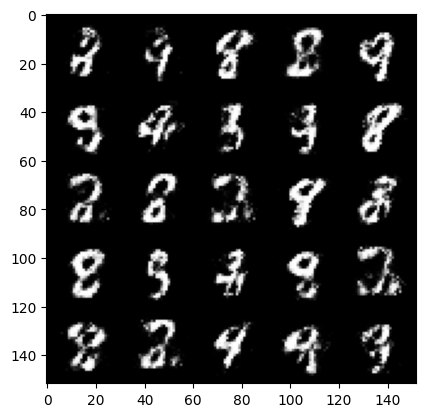

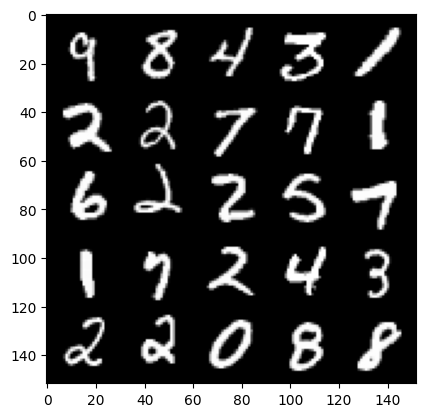

  0%|          | 0/469 [00:00<?, ?it/s]

Step 39000: Generator loss: 2.5430029392242437, discriminator loss: 0.23081166172027606


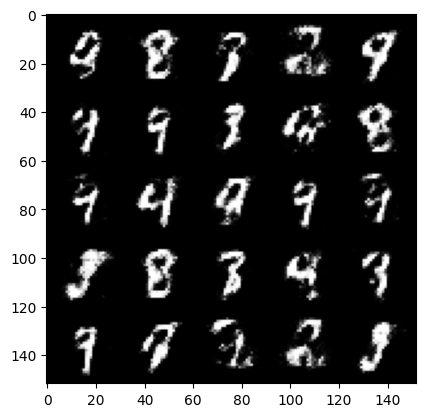

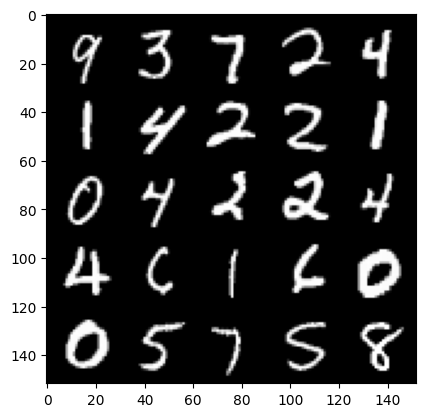

  0%|          | 0/469 [00:00<?, ?it/s]

Step 39500: Generator loss: 2.28202966785431, discriminator loss: 0.30100212270021404


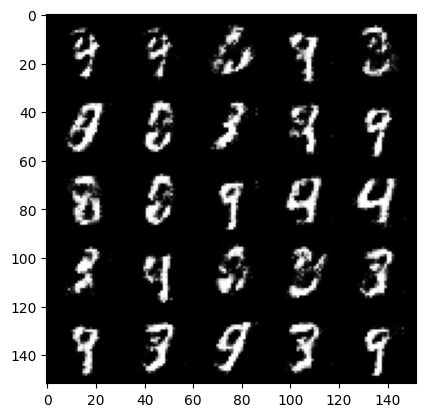

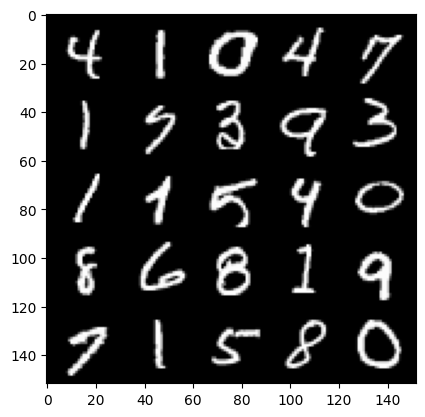

  0%|          | 0/469 [00:00<?, ?it/s]

Step 40000: Generator loss: 2.297153229713441, discriminator loss: 0.27945240974426283


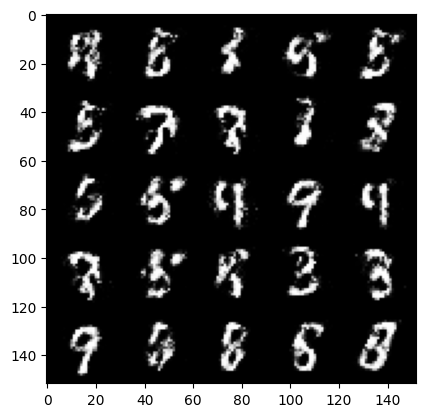

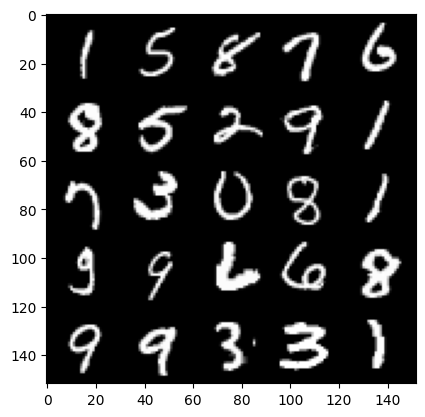

  0%|          | 0/469 [00:00<?, ?it/s]

Step 40500: Generator loss: 2.3684087595939634, discriminator loss: 0.2723119893670079


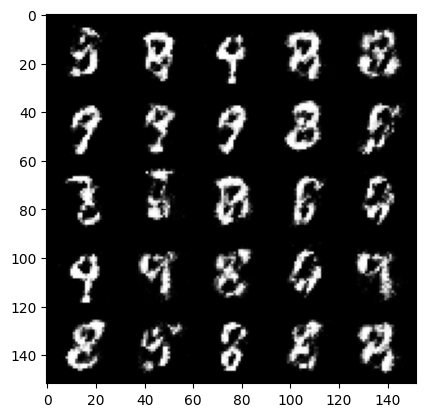

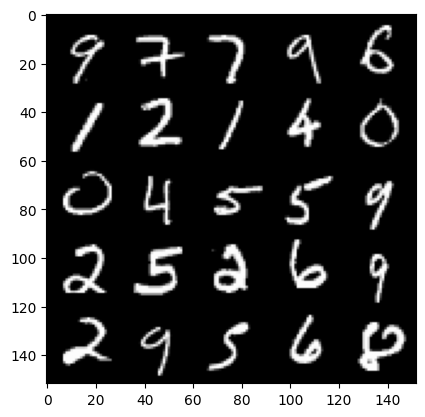

  0%|          | 0/469 [00:00<?, ?it/s]

Step 41000: Generator loss: 2.385501102924347, discriminator loss: 0.2659201404154303


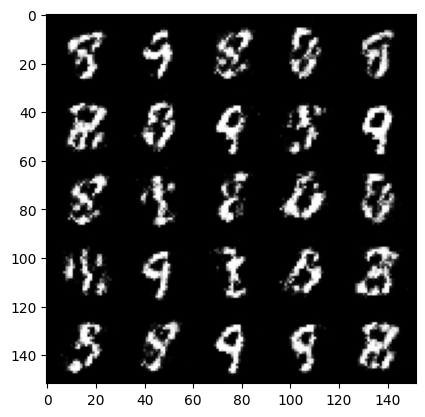

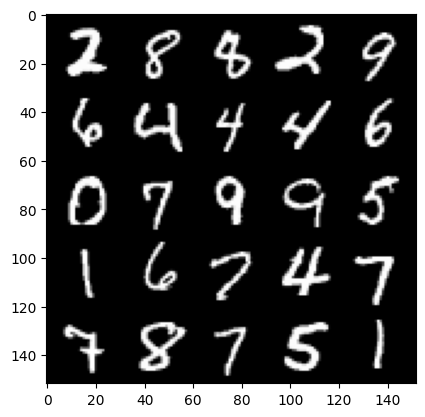

  0%|          | 0/469 [00:00<?, ?it/s]

Step 41500: Generator loss: 2.3950689370632174, discriminator loss: 0.26169061222672496


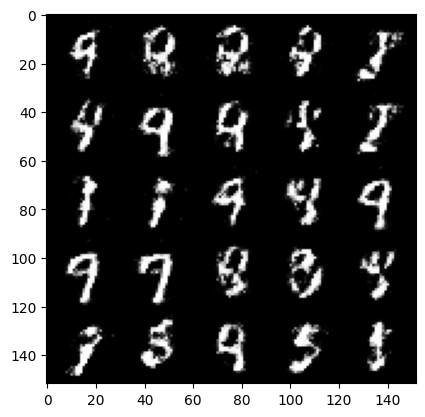

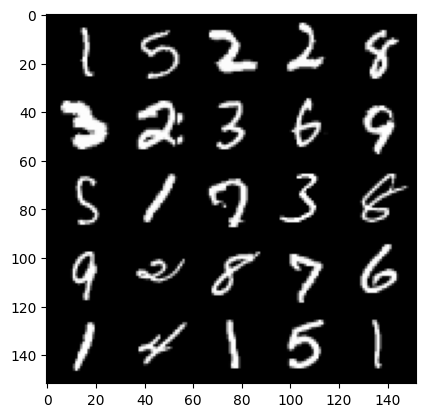

  0%|          | 0/469 [00:00<?, ?it/s]

Step 42000: Generator loss: 2.3207839856147774, discriminator loss: 0.2685298089683058


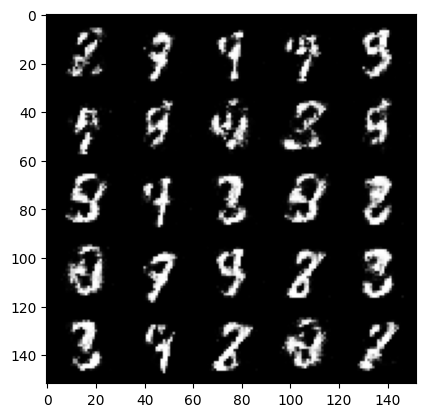

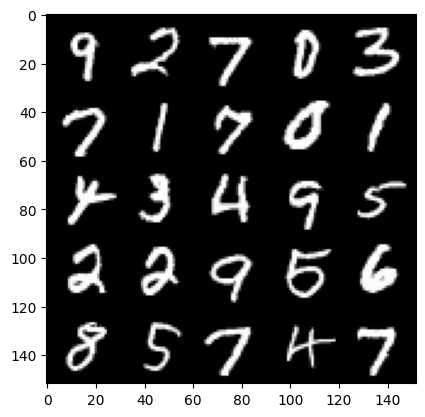

  0%|          | 0/469 [00:00<?, ?it/s]

Step 42500: Generator loss: 2.2815157287120797, discriminator loss: 0.28276986548304545


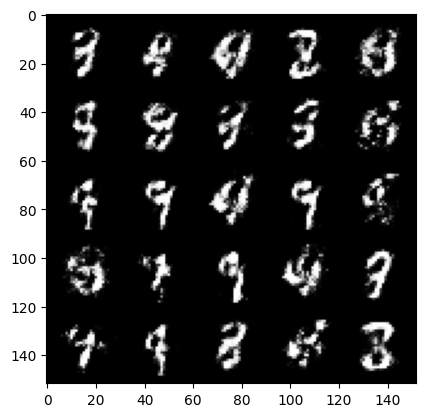

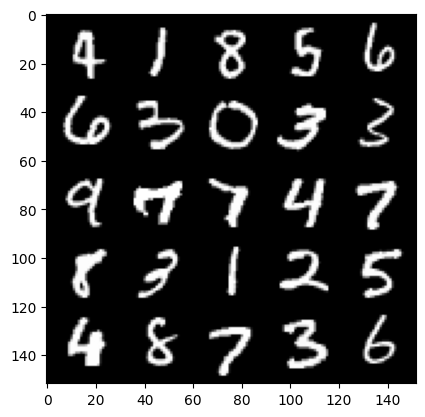

  0%|          | 0/469 [00:00<?, ?it/s]

Step 43000: Generator loss: 2.3647677576541914, discriminator loss: 0.24949019029736516


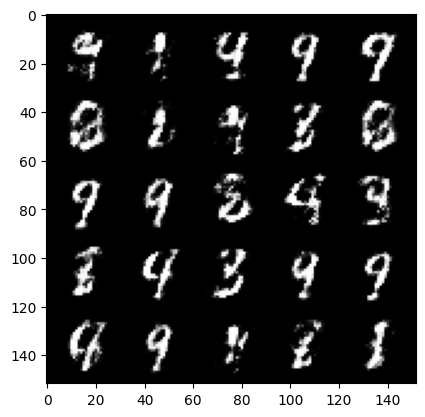

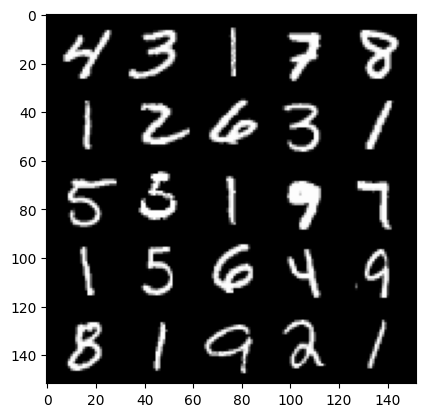

  0%|          | 0/469 [00:00<?, ?it/s]

Step 43500: Generator loss: 2.262521175861358, discriminator loss: 0.28833356457948706


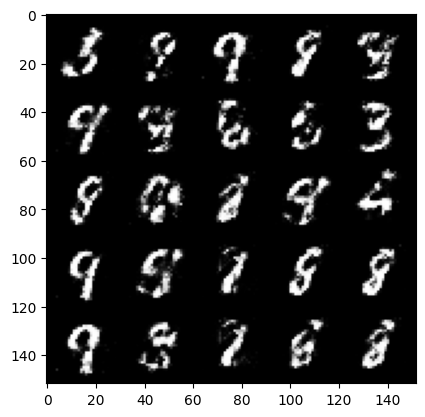

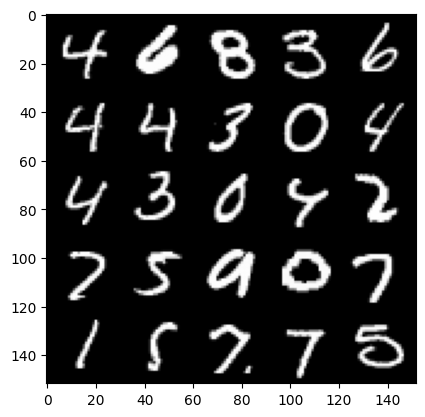

  0%|          | 0/469 [00:00<?, ?it/s]

Step 44000: Generator loss: 2.2897190830707546, discriminator loss: 0.2827089464962482


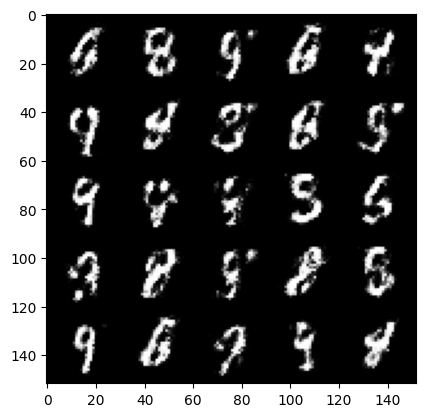

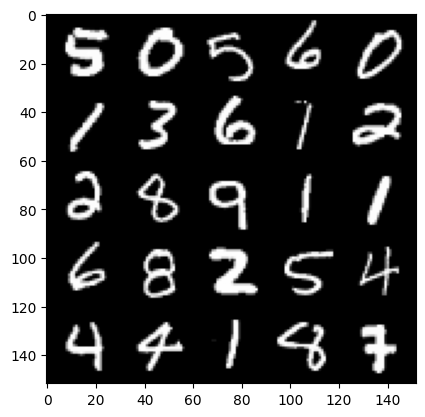

  0%|          | 0/469 [00:00<?, ?it/s]

Step 44500: Generator loss: 2.2682424762248976, discriminator loss: 0.2900807008445263


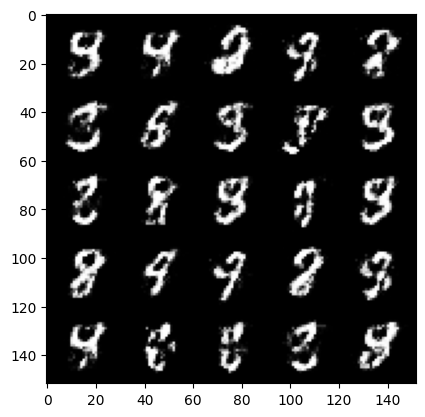

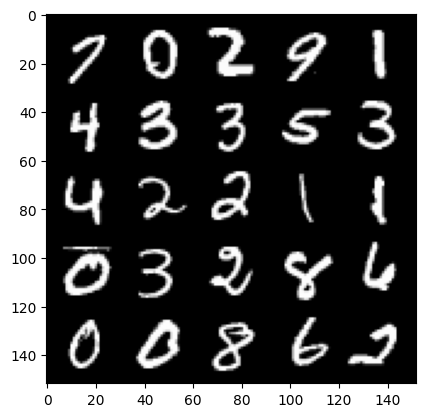

  0%|          | 0/469 [00:00<?, ?it/s]

Step 45000: Generator loss: 2.2395692896842965, discriminator loss: 0.3015378454327579


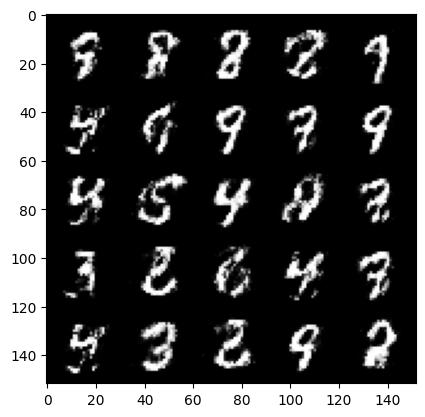

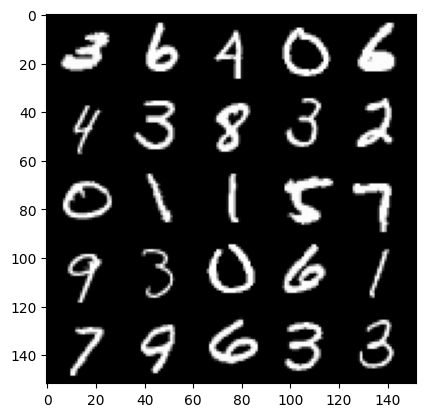

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 45500: Generator loss: 2.31112345790863, discriminator loss: 0.2791280210018157


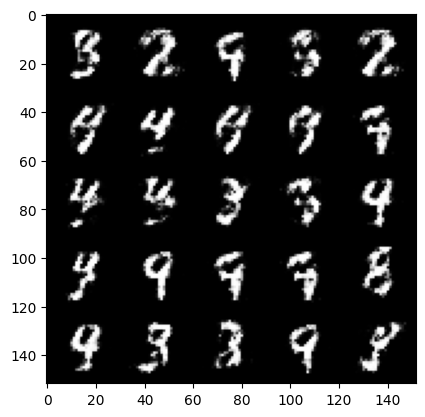

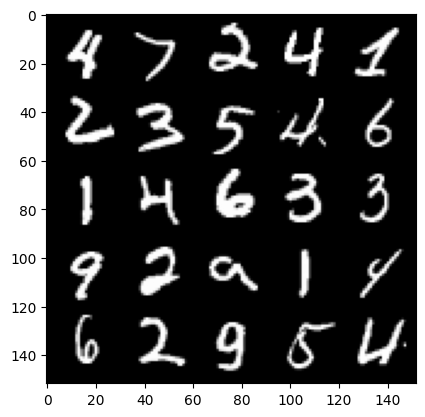

  0%|          | 0/469 [00:00<?, ?it/s]

Step 46000: Generator loss: 2.2129598326683064, discriminator loss: 0.28351501977443694


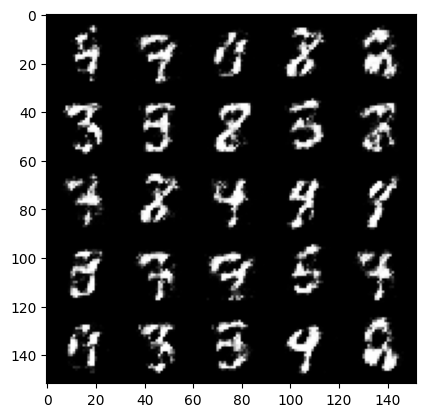

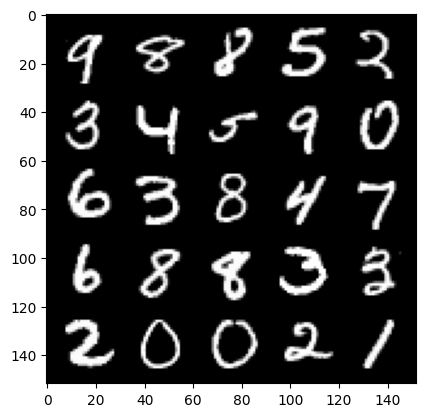

  0%|          | 0/469 [00:00<?, ?it/s]

Step 46500: Generator loss: 2.3398872120380423, discriminator loss: 0.27082738801837


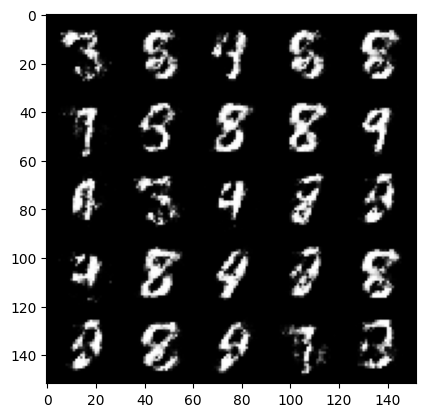

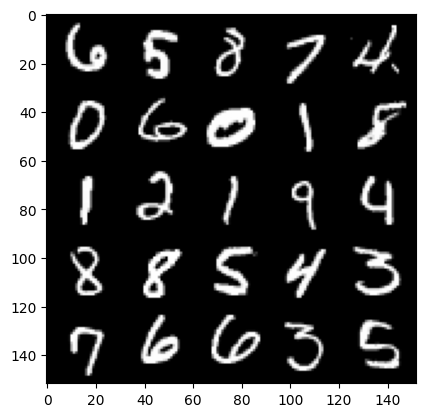

In [17]:
# OPTIONAL PART

cur_step = 0
mean_generator_loss = 0
mean_discriminator_loss = 0
test_generator = True # Whether the generator should be tested
gen_loss = False
error = False
for epoch in range(n_epochs):
  
    # Dataloader returns the batches
    for real, _ in tqdm(dataloader):
        cur_batch_size = len(real)

        # Flatten the batch of real images from the dataset
        real = real.view(cur_batch_size, -1).to(device)

        ### Update discriminator ###
        # Zero out the gradients before backpropagation
        disc_opt.zero_grad()

        # Calculate discriminator loss
        disc_loss = get_disc_loss(gen, disc, criterion, real, cur_batch_size, z_dim, device)

        # Update gradients
        disc_loss.backward(retain_graph=True)

        # Update optimizer
        disc_opt.step()

        # For testing purposes, to keep track of the generator weights
        if test_generator:
            old_generator_weights = gen.gen[0][0].weight.detach().clone()

        ### Update generator ###
        #     Hint: This code will look a lot like the discriminator updates!
        #     These are the steps you will need to complete:
        #       1) Zero out the gradients.
        #       2) Calculate the generator loss, assigning it to gen_loss.
        #       3) Backprop through the generator: update the gradients and optimizer.
        #### START CODE HERE ####
        # 1. Zero out the gradients before backpropagation
        gen_opt.zero_grad()

        # 2. Calculate the generator loss
        gen_loss = get_gen_loss(gen, disc, criterion, cur_batch_size, z_dim, device)

        # 3. Backpropagate through the generator
        gen_loss.backward()

        # 4. Update the generator optimizer
        gen_opt.step()
        #### END CODE HERE ####

        # For testing purposes, to check that your code changes the generator weights
        if test_generator:
            try:
                assert lr > 0.0000002 or (gen.gen[0][0].weight.grad.abs().max() < 0.0005 and epoch == 0)
                assert torch.any(gen.gen[0][0].weight.detach().clone() != old_generator_weights)
            except:
                error = True
                print("Runtime tests have failed")

        # Keep track of the average discriminator loss
        mean_discriminator_loss += disc_loss.item() / display_step

        # Keep track of the average generator loss
        mean_generator_loss += gen_loss.item() / display_step

        ### Visualization code ###
        if cur_step % display_step == 0 and cur_step > 0:
            print(f"Step {cur_step}: Generator loss: {mean_generator_loss}, discriminator loss: {mean_discriminator_loss}")
            fake_noise = get_noise(cur_batch_size, z_dim, device=device)
            fake = gen(fake_noise)
            show_tensor_images(fake)
            show_tensor_images(real)
            mean_generator_loss = 0
            mean_discriminator_loss = 0
        cur_step += 1


If you don't get any runtime error, it means that your code works. We check that the weights are changing in each iteration within the function.

**Congratulations, you have trained your first GAN**